In [1]:
# я не знаю какие есть архитектуры для RL
# я знаю для CV
# ну в данном случае мы работаем как с табличными данными
# так что модели с линейными слоями нам подходят
# если мало двух слоев будет то добавим еще
# единственное я бы попробовал нормализовать данные
# хотя если сейчас значения в состояниях масштабированы
# то можно и без нормализации можно обойтись

# нормализация нужна когда у нас, например, одна переменная в состояниях принимает значения от 0 до 1,
# а другая переменная принимает значения от 100 до 1000
# естественно они будут вносить разный вклад в функцию ошибки
# следовательно нужно эти обе переменные привести к одному масштабу
# но я думаю нам до этого пока рано
# надо поиграться с тем что имеем сейчас


# SDDSDDSA: так как не особо хорошо интерпретирует результаты
# SDDSDDSA: но он дал хороший результаты среди аутсайдеров
# SDDSDDSA: локальный результат хорош
# SDDSDDSA: но в глобальном смысле t_n должен быть большой

In [2]:
import os
import glob
import gym
import gym_maze
import numpy as np
import random
import time
import tqdm
import json
from collections import Counter
from matplotlib import pyplot as plt
import pandas as pd
exps = list(glob.glob('./experiments/*.json'))

def get_exp_type(fname):
    return fname.split('/')[-1].split('_')[0]

data = []
cnt = Counter()
for experiment in exps:
    d = json.load(open(experiment,'r'))
    if len(d['episode_data'])==0: continue
    name = get_exp_type(experiment)
    d['type'] = name.capitalize()
    d['label'] = f"{d['id']} Ep:{d['episode_n']} Traj n:{d['trajectory_n']} Ln:{d['layers_n']} Q:{d['q_param']}"
    cnt.update(d['version'])
    data.append(d)
# data=list(sorted(data, key=lambda x: x['trajectory_n']+x['lamd']))

g_trajectories = set([d['trajectory_n'] for d in data])
g_trajectories_len = set([d['trajectory_len'] for d in data])
g_layers = set([str(d['layers_n']) for d in data])
g_q_params =  set([d['q_param'] for d in data])
print(len(data))
print(g_trajectories)
print(g_trajectories_len)
print(g_layers)
print(g_q_params)

190
{100, 70, 200, 10, 300, 50, 150}
{1000, 500}
{'[65, 100]', '[10, 10, 200]', '[10, 10, 100]', '[65, 400, 100]', '[400, 30, 200]', '[200, 65, 10]', '[10, 65]', '[200, 200]', '[150]', '[10, 10, 10]', '[65, 65]', '[10, 100, 65]', '[200, 65]', '[200, 10]', '[10, 30, 200]', '[100, 65, 65]', '[100, 400]', '[200, 30]', '[200, 400]', '[65]', '[10, 200]', '[200]', '[65, 10]', '[400, 30]', '[400, 100]', '[10, 65, 65]', '[200, 200, 400]', '[10, 400]', '[400, 200]', '[10, 100, 100]', '[30, 400]', '[400, 400]', '[65, 65, 200]', '[100, 65]', '[30]', '[10, 30]', '[30, 200]', '[30, 100]', '[400, 10]', '[10, 10]', '[400, 65]', '[100, 200]', '[100, 30]', '[10, 10, 65]', '[30, 10, 30]', '[10, 10, 30]', '[30, 30, 10]', '[10, 65, 30]', '[100, 100]', '[10, 100, 10]', '[100, 400, 30]', '[30, 10, 65]', '[10, 100, 30]', '[65, 200]', '[30, 10, 10]', '[100]', '[30, 400, 400]', '[30, 100, 10]', '[30, 65]', '[10, 100]', '[65, 400]', '[100, 10]', '[10]', '[65, 30]'}
{0.7, 0.8, 0.5, 0.9}


In [3]:
def get_item(a, i):
    if i > len(a)-1:
        return None
#     print(len(a), i)
    return a[i]

In [4]:
def last_std(arr,lastN):
    rewards = np.array(arr)[::,0]
    return np.std(rewards[-lastN:])

def last_mean(arr,lastN):
    rewards = np.array(arr)[::,0]
    return np.mean(rewards[-lastN:])


In [5]:
# do nothing, fire left orientation engine, fire main engine, fire right orientation engine.a

In [197]:
pd_data = []
for d in data:
    ed = np.array(d['episode_data'])
    if not('lr' in d): d['lr']=0.01
    try:
        pd_data.append([d['id'], d['version'], d['lr'], d['episode_n'], d['trajectory_n'], d['trajectory_len'], d['q_param'], 
                        d['total_elapsed'],  d['finished'], 
                        len(d['episode_data']), np.max(ed[::,0]),np.min(ed[::,0][-70:]),np.mean(ed[::,0]),np.mean(ed[::,0][:200]), np.mean(ed[::,0][-25:]), np.mean(ed[::,0][-50:]), np.std(ed[::,0][-50:]), 
                        len(d['layers_n']), 
                        get_item(d['layers_n'],0), get_item(d['layers_n'],1), get_item(d['layers_n'],2)
    #                    ,d['episode_data']
                       ])

        df = pd.DataFrame(columns=['id', 'version', 'lr', 'episode_n', 'trajectory_n', 'trajectory_len', 'q_param', 
                                   'total_elapsed', 'finished',
                               'len_ed','maxed','min70', 'meaned', 'mean200_ed', 'mean25_ed', 'mean50_ed', 'std_ed', 'layers_cnt', 'layers_n1', 'layers_n2', 'layers_n3'
    #                            , 'data'
                              ],
                     data = pd_data)
    except:
        print(d['id'])

In [153]:
df.to_csv('data1.csv', sep='\t')

In [198]:
df[df['id']=='2292098547091']

,id,version,lr,episode_n,trajectory_n,trajectory_len,q_param,total_elapsed,finished,len_ed,...,min70,meaned,mean200_ed,mean25_ed,mean50_ed,std_ed,layers_cnt,layers_n1,layers_n2,layers_n3
132,2292098547091,2,0.01,400,200,500,0.5,22017.954769,True,400,...,196.173005,214.004545,166.810342,269.602251,268.580158,9.979655,1,200,NaN,NaN


In [199]:
df

,id,version,lr,episode_n,trajectory_n,trajectory_len,q_param,total_elapsed,finished,len_ed,...,min70,meaned,mean200_ed,mean25_ed,mean50_ed,std_ed,layers_cnt,layers_n1,layers_n2,layers_n3
0,2287189634114,1,0.010,200,150,500,0.7,14804.552606,True,200,...,116.849819,100.181715,100.181715,222.531080,188.701615,44.634190,1,100,NaN,NaN
1,2287198420634,1,0.010,200,150,500,0.8,15014.121405,True,200,...,4.292272,81.282115,81.282115,143.144873,142.460678,21.489821,1,100,NaN,NaN
2,2287208017163,1,0.010,200,150,500,0.9,9011.934088,True,200,...,99.674008,75.390182,75.390182,216.145610,215.707191,20.699036,1,100,NaN,NaN
3,2287223764251,1,0.010,200,150,1000,0.7,26793.039190,True,200,...,91.991472,76.486916,76.486916,144.686111,147.141633,11.668393,1,100,NaN,NaN
4,2287236024882,1,0.010,200,150,1000,0.8,29568.566618,True,200,...,15.156499,47.082518,47.082518,95.526387,89.584672,20.789522,1,100,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185,62295221248791,6,0.001,400,100,500,0.5,4356.506295,True,400,...,-82.502137,-118.349009,-148.401779,-41.554626,-51.645662,12.089622,2,10,30.0,NaN
186,62295244280154,6,0.001,400,100,500,0.5,13717.566964,True,400,...,-4.981239,-57.325556,-124.722040,39.124110,37.291576,8.752752,2,10,65.0,NaN
187,62295405400446,6,0.001,400,100,500,0.5,17244.367211,True,400,...,38.707706,-41.343488,-117.488466,61.335315,63.294527,5.445180,2,30,65.0,NaN
188,62295516527882,6,0.001,400,100,500,0.5,13168.849214,True,400,...,3.416871,-52.650802,-119.303161,45.162522,42.079824,7.741852,2,65,10.0,NaN


In [9]:
df.sort_values('mean25_ed', ascending=False).head(10)

,id,version,lr,episode_n,trajectory_n,trajectory_len,q_param,total_elapsed,finished,len_ed,max,mean25_ed,mean50_ed,std_ed,layers_cnt,layers_n1,layers_n2,layers_n3
132,2292098547091,2,0.01,400,200,500,0.5,22017.954769,True,400,284.965888,269.602251,268.580158,9.979655,1,200,NaN,NaN
130,2292024736000,2,0.01,400,200,500,0.5,28958.114572,True,400,277.042653,265.589053,262.010732,9.526486,1,150,NaN,NaN
122,2289569819764,1,0.01,200,300,1000,0.5,19451.925294,True,200,276.228152,263.598279,256.169142,14.964869,1,100,NaN,NaN
69,2289384530357,1,0.01,200,150,500,0.5,8044.215785,True,200,274.723978,261.945072,256.295844,15.899406,1,100,NaN,NaN
13,2287789736369,1,0.01,200,150,500,0.8,6739.560764,True,200,272.025567,259.567827,236.850029,37.452773,1,200,NaN,NaN
80,2290092674916,1,0.01,200,300,500,0.5,13431.681405,True,200,276.658989,258.064933,261.404808,12.125584,1,150,NaN,NaN
119,2289524828615,1,0.01,200,300,500,0.7,15543.779846,True,200,270.521520,257.211539,252.912292,11.076982,1,100,NaN,NaN
128,2291950921733,2,0.01,400,200,500,0.5,30139.205586,True,400,282.576267,255.304107,256.753822,23.089123,1,100,NaN,NaN
44,2290748504803,1,0.01,200,300,500,0.7,11197.604180,True,200,278.912210,253.278272,255.932590,15.792391,1,200,NaN,NaN
6,2287465267159,1,0.01,200,150,500,0.7,9801.152788,True,200,275.256048,248.934321,243.696097,26.858776,1,150,NaN,NaN


In [10]:
df.sort_values('mean25_ed', ascending=False).head(10)

,id,version,lr,episode_n,trajectory_n,trajectory_len,q_param,total_elapsed,finished,len_ed,max,mean25_ed,mean50_ed,std_ed,layers_cnt,layers_n1,layers_n2,layers_n3
132,2292098547091,2,0.01,400,200,500,0.5,22017.954769,True,400,284.965888,269.602251,268.580158,9.979655,1,200,NaN,NaN
130,2292024736000,2,0.01,400,200,500,0.5,28958.114572,True,400,277.042653,265.589053,262.010732,9.526486,1,150,NaN,NaN
122,2289569819764,1,0.01,200,300,1000,0.5,19451.925294,True,200,276.228152,263.598279,256.169142,14.964869,1,100,NaN,NaN
69,2289384530357,1,0.01,200,150,500,0.5,8044.215785,True,200,274.723978,261.945072,256.295844,15.899406,1,100,NaN,NaN
13,2287789736369,1,0.01,200,150,500,0.8,6739.560764,True,200,272.025567,259.567827,236.850029,37.452773,1,200,NaN,NaN
80,2290092674916,1,0.01,200,300,500,0.5,13431.681405,True,200,276.658989,258.064933,261.404808,12.125584,1,150,NaN,NaN
119,2289524828615,1,0.01,200,300,500,0.7,15543.779846,True,200,270.521520,257.211539,252.912292,11.076982,1,100,NaN,NaN
128,2291950921733,2,0.01,400,200,500,0.5,30139.205586,True,400,282.576267,255.304107,256.753822,23.089123,1,100,NaN,NaN
44,2290748504803,1,0.01,200,300,500,0.7,11197.604180,True,200,278.912210,253.278272,255.932590,15.792391,1,200,NaN,NaN
6,2287465267159,1,0.01,200,150,500,0.7,9801.152788,True,200,275.256048,248.934321,243.696097,26.858776,1,150,NaN,NaN


In [11]:
df[df['layers_cnt']==2].sort_values('mean25_ed', ascending=False)

,id,version,lr,episode_n,trajectory_n,trajectory_len,q_param,total_elapsed,finished,len_ed,max,mean25_ed,mean50_ed,std_ed,layers_cnt,layers_n1,layers_n2,layers_n3
147,2295712140124,3,0.010,400,100,500,0.5,20236.331723,True,400,267.337376,247.586255,203.219920,52.448482,2,100,30.0,NaN
151,2295853834254,3,0.010,400,100,500,0.5,26365.052454,True,400,276.218813,234.110513,246.441388,28.092807,2,200,10.0,NaN
158,2296081964952,3,0.010,400,100,500,0.5,17018.773725,False,171,271.428914,205.744610,224.424288,49.230919,2,400,65.0,NaN
142,2295544359654,3,0.010,400,100,500,0.5,32941.099582,True,400,242.712001,177.116817,185.322744,52.391263,2,65,30.0,NaN
133,2295195100690,3,0.010,400,100,500,0.5,27729.542618,True,400,165.237098,155.879225,154.945834,5.374700,2,10,10.0,NaN
152,2295878666643,3,0.010,400,100,500,0.5,37644.457715,False,302,248.862395,155.140584,169.601361,43.405867,2,200,30.0,NaN
135,2295269733941,3,0.010,400,100,500,0.5,27402.283667,True,400,187.872098,149.552005,148.835641,13.903595,2,10,100.0,NaN
141,2295516527882,3,0.010,400,100,500,0.5,26810.244438,True,400,227.441981,145.650058,147.635443,29.251097,2,65,10.0,NaN
134,2295221248791,3,0.010,400,100,500,0.5,30737.931730,True,400,167.744193,143.245910,148.896475,10.401661,2,10,30.0,NaN
146,2295684743375,3,0.010,400,100,500,0.5,45331.658856,False,380,164.935875,130.444312,127.586984,16.419632,2,100,10.0,NaN


влияние размера одного слоя сети сети на  
Q:0.5  tn:100 L:[...]

In [12]:
cnt = Counter()
for d in data:
#     cnt.update([f"Q:{d['q_param']}"])
#     cnt.update([f"Q:{d['q_param']} tl:{d['trajectory_len']}"])
#     cnt.update([f"Q:{d['q_param']} tl:{d['trajectory_len']} tn:{d['trajectory_n']}"])
    cnt.update([f"Q:{d['q_param']} tn:{d['trajectory_n']} L:{str(d['layers_n'])}"])
cnt
sorted(cnt.items())


[('Q:0.5 tn:10 L:[100]', 2),
 ('Q:0.5 tn:10 L:[150]', 2),
 ('Q:0.5 tn:10 L:[200]', 2),
 ('Q:0.5 tn:100 L:[10, 10, 100]', 1),
 ('Q:0.5 tn:100 L:[10, 10, 10]', 1),
 ('Q:0.5 tn:100 L:[10, 10, 200]', 1),
 ('Q:0.5 tn:100 L:[10, 10, 30]', 1),
 ('Q:0.5 tn:100 L:[10, 10, 65]', 1),
 ('Q:0.5 tn:100 L:[10, 100, 100]', 1),
 ('Q:0.5 tn:100 L:[10, 100, 10]', 1),
 ('Q:0.5 tn:100 L:[10, 100, 30]', 1),
 ('Q:0.5 tn:100 L:[10, 100, 65]', 1),
 ('Q:0.5 tn:100 L:[10, 100]', 1),
 ('Q:0.5 tn:100 L:[10, 10]', 2),
 ('Q:0.5 tn:100 L:[10, 200]', 1),
 ('Q:0.5 tn:100 L:[10, 30, 200]', 1),
 ('Q:0.5 tn:100 L:[10, 30]', 2),
 ('Q:0.5 tn:100 L:[10, 400]', 1),
 ('Q:0.5 tn:100 L:[10, 65, 30]', 1),
 ('Q:0.5 tn:100 L:[10, 65, 65]', 1),
 ('Q:0.5 tn:100 L:[10, 65]', 2),
 ('Q:0.5 tn:100 L:[100, 100]', 1),
 ('Q:0.5 tn:100 L:[100, 10]', 1),
 ('Q:0.5 tn:100 L:[100, 200]', 1),
 ('Q:0.5 tn:100 L:[100, 30]', 1),
 ('Q:0.5 tn:100 L:[100, 400, 30]', 1),
 ('Q:0.5 tn:100 L:[100, 400]', 1),
 ('Q:0.5 tn:100 L:[100, 65, 65]', 1),
 ('Q:0.5 t

In [1014]:
listyles = {"Laplase":'dashed','Policy':'solid','Cem': 'dotted'}

for group in sorted(groups):
# for group in groups:
    graph_trajectory(data, group)

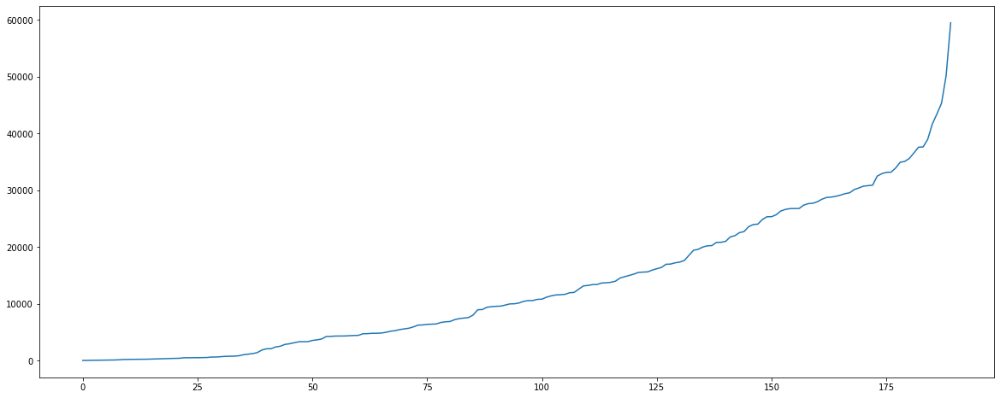

In [13]:
# for group in sorted(groups):
graph_data = []
for ed in sorted(data, key=lambda x: x['total_elapsed']):
    graph_data.append(ed)

plt.figure(figsize=(20,8))
total_elapseds = [ ed['total_elapsed'] for i, ed in enumerate(graph_data)]
plt.plot(range(len(total_elapseds)), total_elapseds)

In [14]:
valid = df['len_ed']==df['episode_n']

In [15]:
np.sum(valid)

159

In [299]:
df.query('finished')

,id,version,lr,episode_n,trajectory_n,trajectory_len,q_param,total_elapsed,finished,len_ed,max,mean25_ed,mean50_ed,std_ed,layers_cnt,layers_n1,layers_n2,layers_n3
0,2287189634114,1,0.010,200,150,500,0.7,14804.552606,True,200,258.153173,222.531080,188.701615,44.634190,1,100,NaN,NaN
1,2287198420634,1,0.010,200,150,500,0.8,15014.121405,True,200,174.845057,143.144873,142.460678,21.489821,1,100,NaN,NaN
2,2287208017163,1,0.010,200,150,500,0.9,9011.934088,True,200,256.298823,216.145610,215.707191,20.699036,1,100,NaN,NaN
3,2287223764251,1,0.010,200,150,1000,0.7,26793.039190,True,200,173.426003,144.686111,147.141633,11.668393,1,100,NaN,NaN
4,2287236024882,1,0.010,200,150,1000,0.8,29568.566618,True,200,120.867089,95.526387,89.584672,20.789522,1,100,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185,62295221248791,6,0.001,400,100,500,0.5,4356.506295,True,400,-26.628075,-41.554626,-51.645662,12.089622,2,10,30.0,NaN
186,62295244280154,6,0.001,400,100,500,0.5,13717.566964,True,400,54.291891,39.124110,37.291576,8.752752,2,10,65.0,NaN
187,62295405400446,6,0.001,400,100,500,0.5,17244.367211,True,400,72.227663,61.335315,63.294527,5.445180,2,30,65.0,NaN
188,62295516527882,6,0.001,400,100,500,0.5,13168.849214,True,400,58.344168,45.162522,42.079824,7.741852,2,65,10.0,NaN


In [303]:
select_cols = ['lr','episode_n','trajectory_n','trajectory_len','q_param','max', 'layers_cnt']
df[select_cols]

,lr,episode_n,trajectory_n,trajectory_len,q_param,max,layers_cnt
0,0.010,200,150,500,0.7,258.153173,1
1,0.010,200,150,500,0.8,174.845057,1
2,0.010,200,150,500,0.9,256.298823,1
3,0.010,200,150,1000,0.7,173.426003,1
4,0.010,200,150,1000,0.8,120.867089,1
...,...,...,...,...,...,...,...
185,0.001,400,100,500,0.5,-26.628075,2
186,0.001,400,100,500,0.5,54.291891,2
187,0.001,400,100,500,0.5,72.227663,2
188,0.001,400,100,500,0.5,58.344168,2


/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seabor

/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seabor

/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seabor

/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seabor

/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seabor

/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seabor

/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seabor

/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seabor

/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seabor

/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seabor

/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seabor

/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seabor

/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seabor

/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seabor

/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seabor

/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seabor

/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/seabor

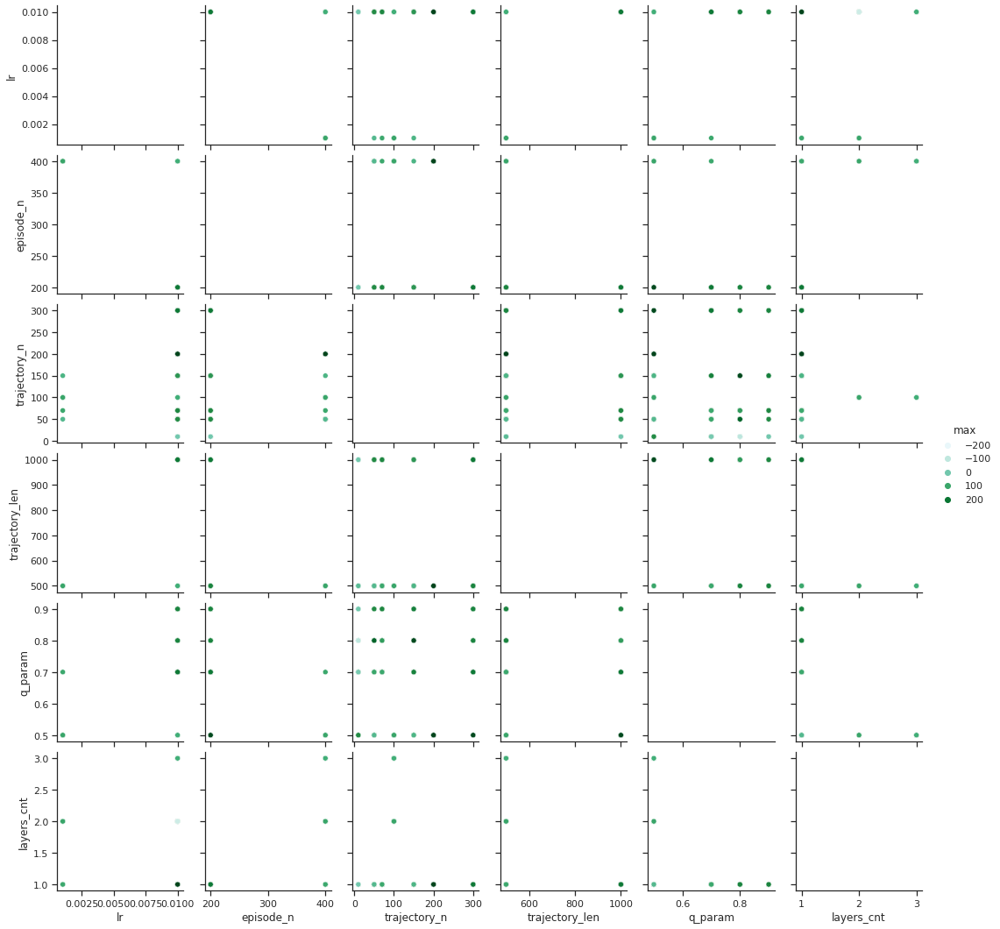

In [313]:
import seaborn as sns
# sns.set_theme(style="ticks")
sns.set_palette("viridis")


sns.pairplot(df[select_cols], hue="max", palette='BuGn')

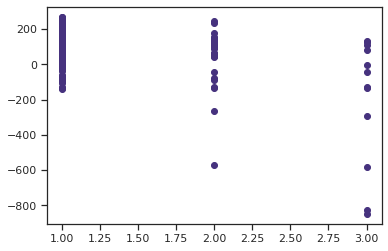

In [314]:
plt.scatter(df[valid]['layers_cnt'], df[valid]['mean25_ed'])

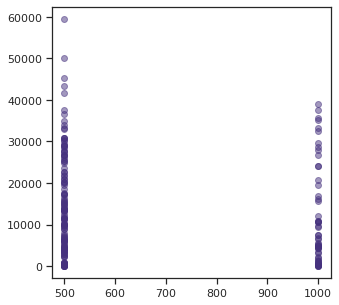

In [315]:
# for group in sorted(groups):
graph_data = []
for ed in sorted(data, key=lambda x: x['total_elapsed']):
    graph_data.append(ed)

plt.figure(figsize=(5,5))
total_elapseds = [ed['total_elapsed'] for i, ed in enumerate(graph_data)]
trajectory_n = [ed['trajectory_len'] for i, ed in enumerate(graph_data)]
plt.scatter(trajectory_n, total_elapseds, alpha=0.5)

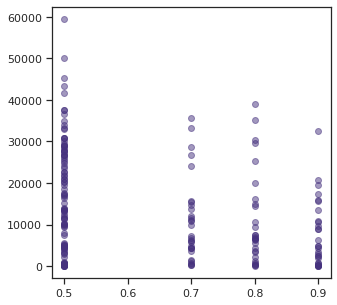

In [316]:
# for group in sorted(groups):
graph_data = []
for ed in sorted(data, key=lambda x: x['total_elapsed']):
    graph_data.append(ed)

plt.figure(figsize=(5,5))
total_elapseds = [ed['total_elapsed'] for i, ed in enumerate(graph_data)]
trajectory_n = [ed['q_param'] for i, ed in enumerate(graph_data)]
plt.scatter(trajectory_n, total_elapseds, alpha=0.5)

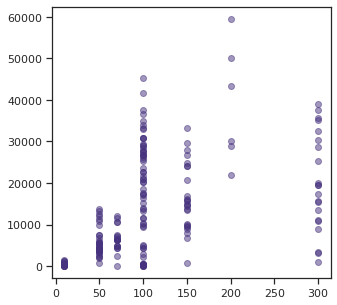

In [317]:
# for group in sorted(groups):
graph_data = []
for ed in sorted(data, key=lambda x: x['total_elapsed']):
    graph_data.append(ed)

plt.figure(figsize=(5,5))
total_elapseds = [ed['total_elapsed'] for i, ed in enumerate(graph_data)]
trajectory_n = [ed['trajectory_n'] for i, ed in enumerate(graph_data)]
plt.scatter(trajectory_n, total_elapseds, alpha=0.5)

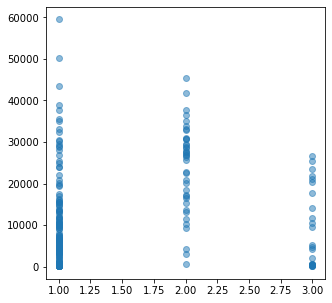

In [21]:
# for group in sorted(groups):
graph_data = []
for ed in sorted(data, key=lambda x: x['total_elapsed']):
    graph_data.append(ed)

plt.figure(figsize=(5,5))
total_elapseds = [ed['total_elapsed'] for i, ed in enumerate(graph_data)]
trajectory_n = [len(ed['layers_n']) for i, ed in enumerate(graph_data)]
plt.scatter(trajectory_n, total_elapseds, alpha=0.5)

Q Parameter

двуслойная сеть с разным количество слоев и разной троекторией при одной и той же q

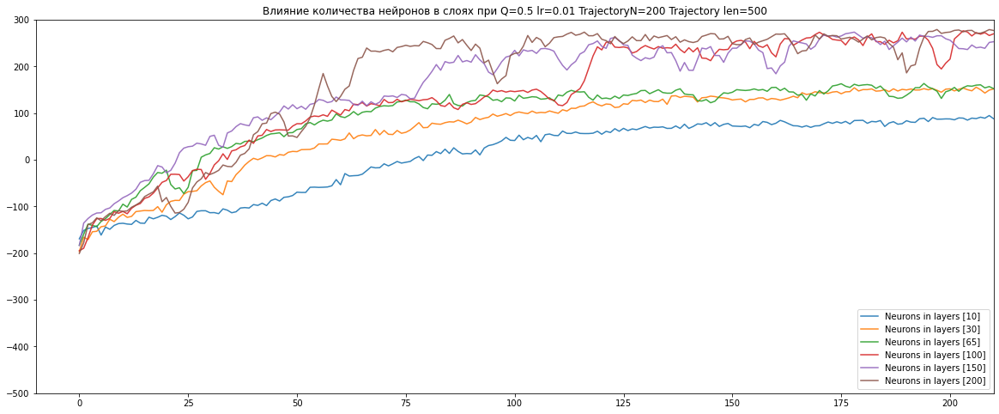

In [152]:
tdf = df.query('lr==0.01 and q_param==0.5 and layers_cnt==1 and finished and trajectory_n==200')
tdf

graph_data = []
filtered_list = tdf['id'].to_list()
for ed in sorted(data, key=lambda x:x['layers_n'][0]):
    if not (ed['id'] in filtered_list): continue
    graph_data.append(ed)

plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    episode_data = np.array(ed['episode_data'])
#     lable = f"Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    lable = f"Neurons in layers {ed['layers_n']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
leg = plt.legend(loc='lower right')
# plt.title(f'Влияние количества нейронов в слоях при Q=0.5 Trajectory N=200 Trajectory len=500')
plt.title(f"Влияние количества нейронов в слоях при Q={ed['q_param']} lr={ed['lr']} TrajectoryN={ed['trajectory_n']} Trajectory len={ed['trajectory_len']}")

plt.ylim((-500, 300))
plt.xlim((-10, 210))
plt.show()

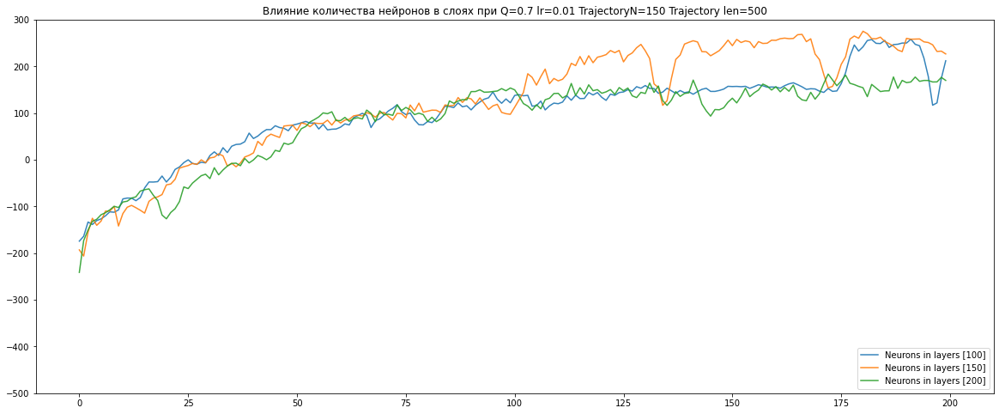

In [150]:
tdf = df.query('lr==0.01 and q_param==0.7 and layers_cnt==1 and finished and trajectory_n==150 and trajectory_len==500')
tdf

# влияние размера одного слоя сети сети на  
# Q:0.5  tn:100 L:[...]
graph_data = []
filtered_list = tdf['id'].to_list()
for ed in sorted(data, key=lambda x:x['layers_n'][0]):
#     if ed['q_param']!=0.5:continue
#     if ed['trajectory_n']!=150:continue
#     if len(ed['layers_n'])!=1:continue
    if not (ed['id'] in filtered_list): continue
    graph_data.append(ed)

plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
#     print(ed['id'])
    episode_data = np.array(ed['episode_data'])
#     lable = f"Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    lable = f"Neurons in layers {ed['layers_n']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
leg = plt.legend(loc='lower right')
plt.title(f"Влияние количества нейронов в слоях при Q={ed['q_param']} lr={ed['lr']} TrajectoryN={ed['trajectory_n']} Trajectory len={ed['trajectory_len']}")

plt.ylim((-500, 300))
plt.xlim((-10, 210))

plt.show()

In [92]:
tdf = df.query('layers_cnt==1 and layers_n1==100 and finished and trajectory_len==500')
tdf

,id,version,lr,episode_n,trajectory_n,trajectory_len,q_param,total_elapsed,finished,len_ed,mean25_ed,mean50_ed,std_ed,layers_cnt,layers_n1,layers_n2,layers_n3
0,2287189634114,1,0.010,200,150,500,0.7,14804.552606,True,200,222.531080,188.701615,44.634190,1,100,NaN,NaN
1,2287198420634,1,0.010,200,150,500,0.8,15014.121405,True,200,143.144873,142.460678,21.489821,1,100,NaN,NaN
2,2287208017163,1,0.010,200,150,500,0.9,9011.934088,True,200,216.145610,215.707191,20.699036,1,100,NaN,NaN
26,6399962801,1,0.010,200,10,500,0.8,712.129582,True,200,6.180921,27.742853,43.882333,1,100,NaN,NaN
27,6400331685,1,0.010,200,10,500,0.9,119.552016,True,200,-134.628047,-134.547047,28.799654,1,100,NaN,NaN
31,6402171926,1,0.010,200,50,500,0.7,3675.003798,True,200,195.864619,163.866623,40.217769,1,100,NaN,NaN
32,6402388579,1,0.010,200,50,500,0.8,4446.094448,True,200,82.446494,82.630329,19.279460,1,100,NaN,NaN
33,6402805501,1,0.010,200,50,500,0.9,2873.416922,True,200,19.361123,37.841766,27.123552,1,100,NaN,NaN
51,6398894595,1,0.010,200,10,500,0.7,429.694243,True,200,14.417266,12.378348,18.333258,1,100,NaN,NaN
65,2289148389097,1,0.010,200,10,500,0.5,134.138622,True,200,-21.601254,-57.249783,42.877370,1,100,NaN,NaN


In [156]:
filtered_list = ['2289384530357',
'2287189634114',
'2287198420634',
'2287208017163']

df[df['id'].isin(filtered_list)]

,id,version,lr,episode_n,trajectory_n,trajectory_len,q_param,total_elapsed,finished,len_ed,mean25_ed,mean50_ed,std_ed,layers_cnt,layers_n1,layers_n2,layers_n3
0,2287189634114,1,0.01,200,150,500,0.7,14804.552606,True,200,222.531080,188.701615,44.634190,1,100,NaN,NaN
1,2287198420634,1,0.01,200,150,500,0.8,15014.121405,True,200,143.144873,142.460678,21.489821,1,100,NaN,NaN
2,2287208017163,1,0.01,200,150,500,0.9,9011.934088,True,200,216.145610,215.707191,20.699036,1,100,NaN,NaN
69,2289384530357,1,0.01,200,150,500,0.5,8044.215785,True,200,261.945072,256.295844,15.899406,1,100,NaN,NaN


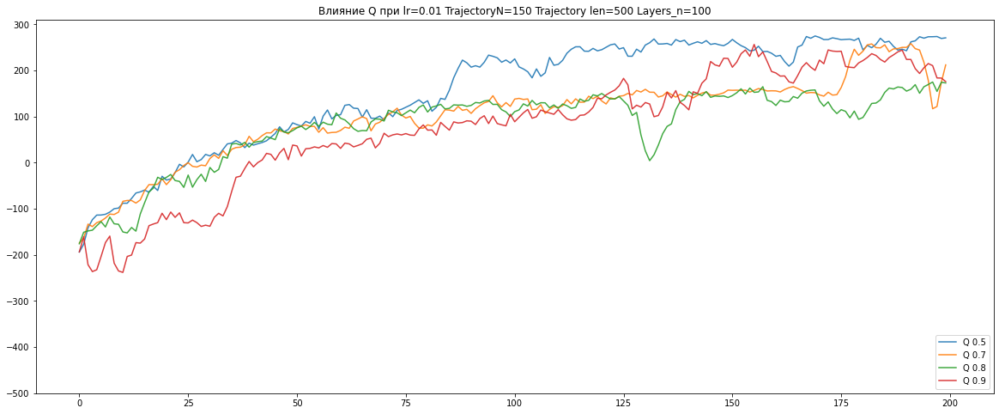

In [157]:
graph_data = []
for ed in sorted(data, key=lambda x:x['q_param']):
    if not (ed['id'] in filtered_list): continue
    graph_data.append(ed)

plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
#     print(ed['id'])
    episode_data = np.array(ed['episode_data'])
#     lable = f"Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    lable = f"Q {ed['q_param']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
leg = plt.legend(loc='lower right')
plt.title(f"Влияние Q при lr={ed['lr']} TrajectoryN={ed['trajectory_n']} Trajectory len={ed['trajectory_len']} Layers_n={ed['layers_n'][0]}")
plt.ylim((-500, 310))
plt.xlim((-10, 210))
plt.show()

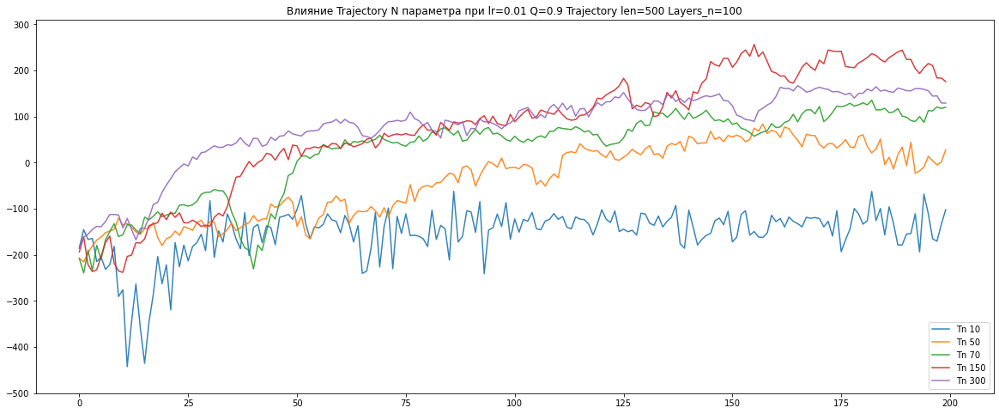

In [158]:
graph_data = []
filtered_list = ['6400331685','6402805501',
'6404800191',
'2287208017163',
'2289554170067'
]
for ed in sorted(data, key=lambda x:x['trajectory_n']):
    if not (ed['id'] in filtered_list): continue
    graph_data.append(ed)

plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
#     print(ed['id'])
    episode_data = np.array(ed['episode_data'])
#     lable = f"Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    lable = f"Tn {ed['trajectory_n']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
leg = plt.legend(loc='lower right')
plt.title(f"Влияние Trajectory N параметра при lr={ed['lr']} Q={ed['q_param']} Trajectory len={ed['trajectory_len']} Layers_n={ed['layers_n'][0]}")
plt.ylim((-500, 310))
plt.xlim((-10, 210))
plt.show()

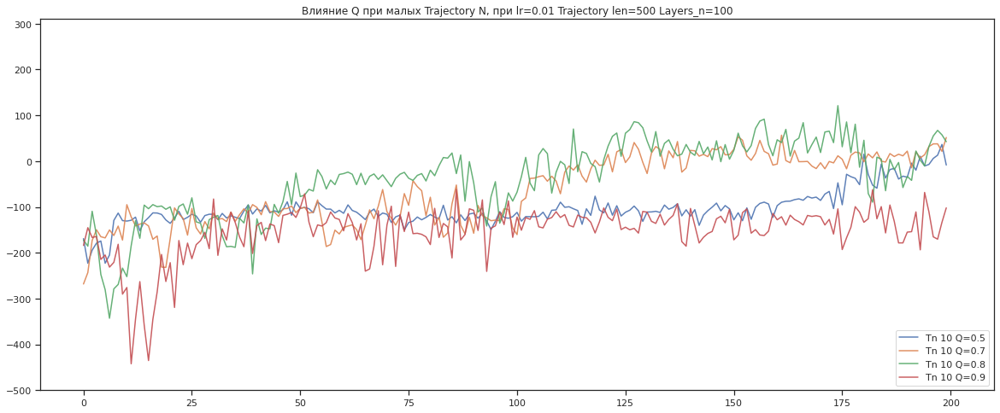

In [309]:
graph_data = []
filtered_list = [
'2289148389097',
'6398894595',
'6399962801',
'6400331685',

]
for ed in sorted(data, key=lambda x:x['q_param']):
    if not (ed['id'] in filtered_list): continue
    graph_data.append(ed)

plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
#     print(ed['id'])
    episode_data = np.array(ed['episode_data'])
#     lable = f"Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    lable = f"Tn {ed['trajectory_n']} Q={ed['q_param']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
leg = plt.legend(loc='lower right')
plt.title(f"Влияние Q при малых Trajectory N, при lr={ed['lr']} Trajectory len={ed['trajectory_len']} Layers_n={ed['layers_n'][0]}")
plt.ylim((-500, 310))
plt.xlim((-10, 210))
plt.show()

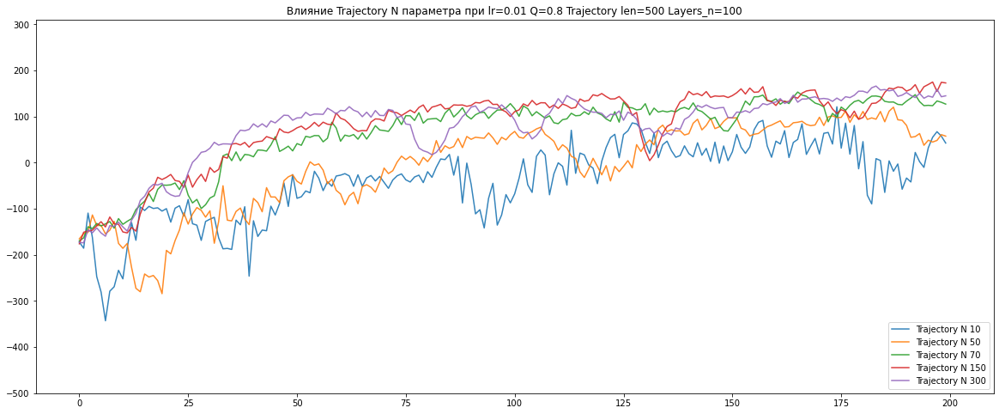

In [159]:
graph_data = []
filtered_list = [
'6399962801',
'6402388579',
'6404474504',
'2287198420634',
'2289538816485'
]
for ed in sorted(data, key=lambda x:x['trajectory_n']):
    if not (ed['id'] in filtered_list): continue
    graph_data.append(ed)

plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
#     print(ed['id'])
    episode_data = np.array(ed['episode_data'])
#     lable = f"Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    lable = f"Trajectory N {ed['trajectory_n']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
leg = plt.legend(loc='lower right')
plt.title(f"Влияние Trajectory N параметра при lr={ed['lr']} Q={ed['q_param']} Trajectory len={ed['trajectory_len']} Layers_n={ed['layers_n'][0]}")
plt.ylim((-500, 310))
plt.xlim((-10, 210))
plt.show()

2289148389097 Tn 10
2291925953700 Tn 50
2289384530357 Tn 150
2291950921733 Tn 200


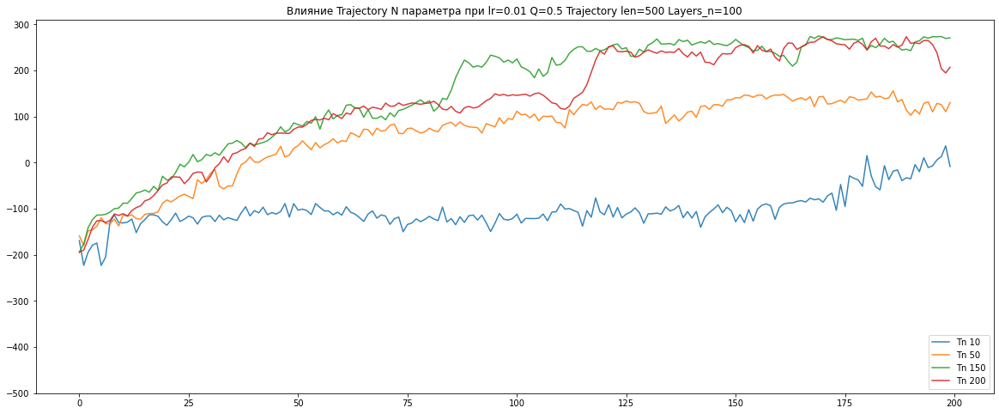

In [225]:
graph_data = []
filtered_list = [
'2289148389097',
'2291925953700',
'2289384530357',
'2291950921733']
for ed in sorted(data, key=lambda x:x['trajectory_n']):
    if not (ed['id'] in filtered_list): continue
    graph_data.append(ed)

plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
#     
    episode_data = np.array(ed['episode_data'])
#     lable = f"Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    lable = f"Tn {ed['trajectory_n']}"
    print(ed['id'], lable)
    plt.plot(range(len(episode_data[:200])), 
             episode_data[::,0][:200],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
leg = plt.legend(loc='lower right')
plt.title(f"Влияние Trajectory N параметра при lr={ed['lr']} Q={ed['q_param']} Trajectory len={ed['trajectory_len']} Layers_n={ed['layers_n'][0]}")
plt.ylim((-500, 310))
plt.show()

In [ ]:
влияние LR

2292073209259 Tn 50
52290410650317 Tn 50


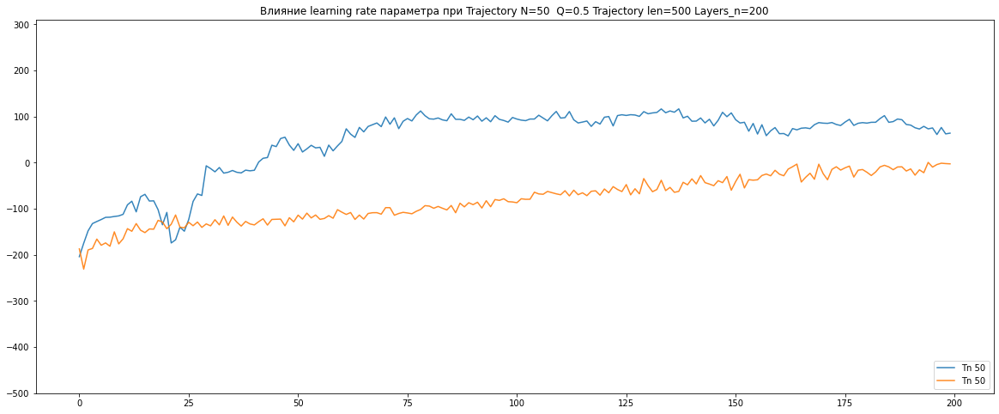

In [220]:
graph_data = []
filtered_list = [

'2292073209259',
'52290410650317'
]
for ed in sorted(data, key=lambda x:x['trajectory_n']):
    if not (ed['id'] in filtered_list): continue
    graph_data.append(ed)

plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
#     
    episode_data = np.array(ed['episode_data'])
#     lable = f"Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    lable = f"Tn {ed['trajectory_n']}"
    print(ed['id'], lable)
    plt.plot(range(len(episode_data[:200])), 
             episode_data[::,0][:200],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
leg = plt.legend(loc='lower right')
plt.title(f"Влияние learning rate параметра при Trajectory N={ed['trajectory_n']}  Q={ed['q_param']} Trajectory len={ed['trajectory_len']} Layers_n={ed['layers_n'][0]}")
plt.ylim((-500, 310))
plt.show()

In [229]:
linestyles = {
    0.5: ['solid','red'],
    0.7: ['dashed','blue'],
    0.8: ['dotted', 'green'],
    0.9: ['dashdot', 'orange']
}

2289384530357 Q=0.5 Trajectory N=500
2289443530024 Q=0.5 Trajectory N=1000
2287189634114 Q=0.7 Trajectory N=500
2287223764251 Q=0.7 Trajectory N=1000
2287198420634 Q=0.8 Trajectory N=500
2287236024882 Q=0.8 Trajectory N=1000
2287208017163 Q=0.9 Trajectory N=500
2287244988261 Q=0.9 Trajectory N=1000


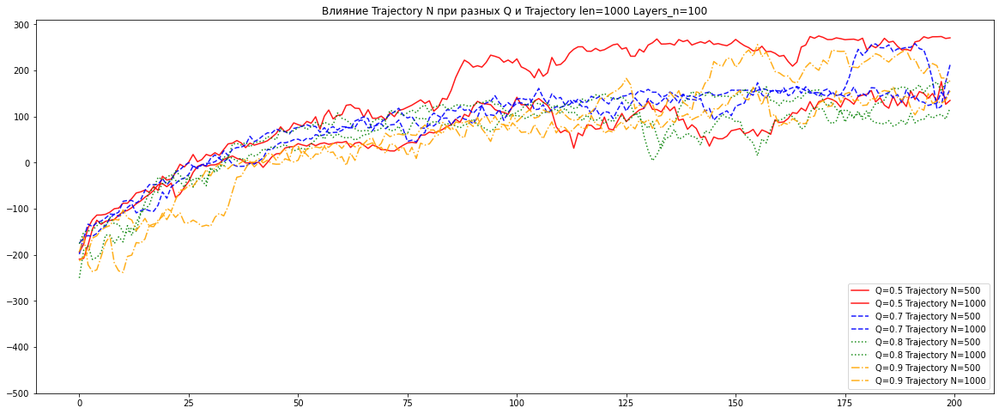

In [231]:
graph_data = []
filtered_list = [

'2289384530357',
'2289443530024',
'2287189634114',
'2287223764251',
'2287198420634',
'2287236024882',
'2287208017163',
'2287244988261'
]
for ed in sorted(data, key=lambda x:x['q_param']):
    if not (ed['id'] in filtered_list): continue
    graph_data.append(ed)

plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
#     
    episode_data = np.array(ed['episode_data'])
#     lable = f"Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    lable = f"Q={ed['q_param']} Trajectory N={ed['trajectory_len']}"
    print(ed['id'], lable)
    plt.plot(range(len(episode_data[:200])), 
             episode_data[::,0][:200],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = linestyles[ed['q_param']][0],#'dashed' if i > 6 else 'solid',
             color=linestyles[ed['q_param']][1],
             label=lable)
leg = plt.legend(loc='lower right')
plt.title(f"Влияние Trajectory N при разных Q и Trajectory len={ed['trajectory_len']} Layers_n={ed['layers_n'][0]}")
plt.ylim((-500, 310))
plt.show()

2295405400446 Q=0.5 Trajectory N=500
62295405400446 Q=0.5 Trajectory N=500


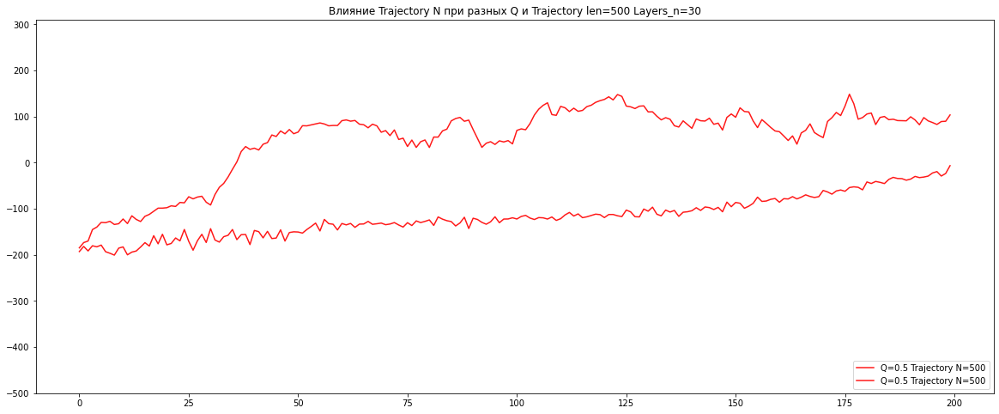

In [232]:
graph_data = []
filtered_list = [
'2295405400446',
'62295405400446'
]
for ed in sorted(data, key=lambda x:x['q_param']):
    if not (ed['id'] in filtered_list): continue
    graph_data.append(ed)

plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
#     
    episode_data = np.array(ed['episode_data'])
#     lable = f"Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    lable = f"Q={ed['q_param']} Trajectory N={ed['trajectory_len']}"
    print(ed['id'], lable)
    plt.plot(range(len(episode_data[:200])), 
             episode_data[::,0][:200],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = linestyles[ed['q_param']][0],#'dashed' if i > 6 else 'solid',
             color=linestyles[ed['q_param']][1],
             label=lable)
leg = plt.legend(loc='lower right')
plt.title(f"Влияние Trajectory N при разных Q и Trajectory len={ed['trajectory_len']} Layers_n={ed['layers_n'][0]}")
plt.ylim((-500, 310))
plt.show()

In [214]:
filtered_list = [
'2289384530357',
'2291950921733',
'6402171926',
'2287189634114',
'2289524828615',
'2287208017163']

df[df['id'].isin(filtered_list)]

,id,version,lr,episode_n,trajectory_n,trajectory_len,q_param,total_elapsed,finished,len_ed,mean25_ed,mean50_ed,std_ed,layers_cnt,layers_n1,layers_n2,layers_n3
0,2287189634114,1,0.01,200,150,500,0.7,14804.552606,True,200,222.531080,188.701615,44.634190,1,100,NaN,NaN
2,2287208017163,1,0.01,200,150,500,0.9,9011.934088,True,200,216.145610,215.707191,20.699036,1,100,NaN,NaN
31,6402171926,1,0.01,200,50,500,0.7,3675.003798,True,200,195.864619,163.866623,40.217769,1,100,NaN,NaN
69,2289384530357,1,0.01,200,150,500,0.5,8044.215785,True,200,261.945072,256.295844,15.899406,1,100,NaN,NaN
119,2289524828615,1,0.01,200,300,500,0.7,15543.779846,True,200,257.211539,252.912292,11.076982,1,100,NaN,NaN
128,2291950921733,2,0.01,400,200,500,0.5,30139.205586,True,400,255.304107,256.753822,23.089123,1,100,NaN,NaN


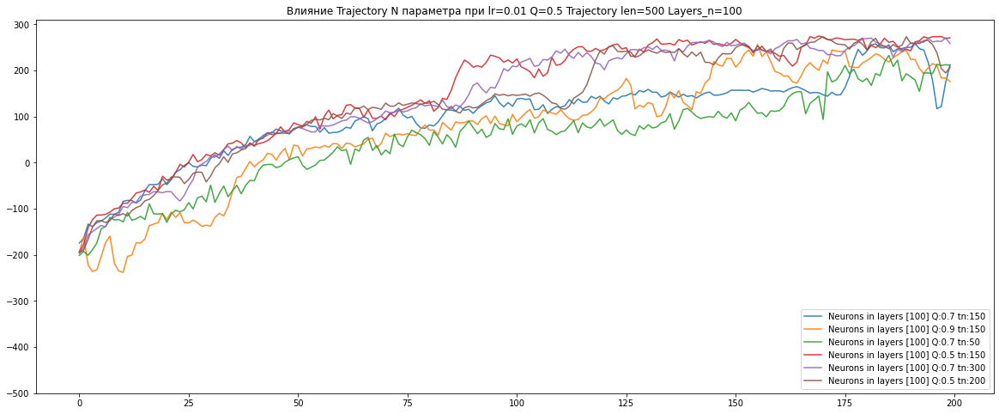

In [215]:
# влияние размера одного слоя сети сети на  
# Q:0.5  tn:100 L:[...]
graph_data = []
# filtered_list = tdf['id'].to_list()
for ed in sorted(data, key=lambda x:x['layers_n'][0]):
#     if ed['q_param']!=0.5:continue
#     if ed['trajectory_n']!=150:continue
#     if len(ed['layers_n'])!=1:continue
    if not (ed['id'] in filtered_list): continue
    graph_data.append(ed)

plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
#     print(ed['id'])
    episode_data = np.array(ed['episode_data'][:200])
#     lable = f"Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    lable = f"Neurons in layers {ed['layers_n']} Q:{ed['q_param']} tn:{ed['trajectory_n']}"
    plt.plot(range(len(episode_data[:200])), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
leg = plt.legend(loc='lower right')
plt.title(f"Влияние Trajectory N параметра при lr={ed['lr']} Q={ed['q_param']} Trajectory len={ed['trajectory_len']} Layers_n={ed['layers_n'][0]}")
plt.ylim((-500, 310))
plt.show()

время работы алгоритма

# triple layers

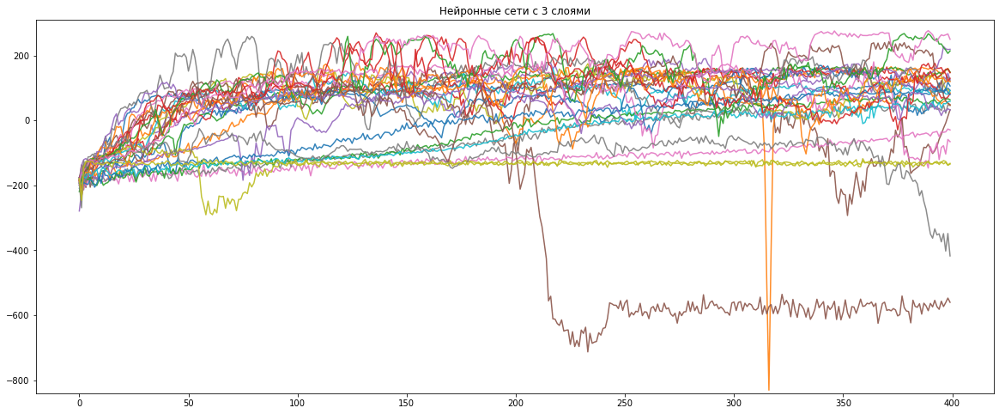

In [57]:
tdf = df.query('layers_cnt==2 and finished')
# влияние размера одного слоя сети сети на  
# Q:0.5  tn:100 L:[...]
graph_data = []
filtered_list = tdf['id'].to_list()
for ed in sorted(data, key=lambda x:x['layers_n'][0]):
#     if ed['q_param']!=0.5:continue
#     if ed['trajectory_n']!=150:continue
#     if len(ed['layers_n'])!=1:continue
    if not (ed['id'] in filtered_list): continue
    graph_data.append(ed)

plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
#     print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    lable = f"Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
#     lable = f"Neurons in layers {ed['layers_n']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
# leg = plt.legend(loc='lower right')
plt.title('Нейронные сети с 3 слоями')
plt.ylim((-840, 310))
plt.show()

1
2
3
4
5


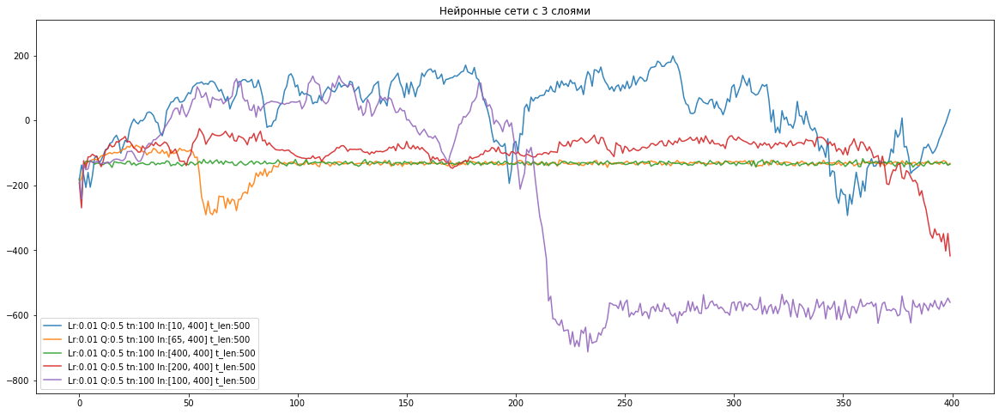

In [58]:
tdf = df.query('layers_cnt==2 and mean50_ed < -50  and finished and lr==0.01').sort_values('mean25_ed')
graph_data = []
filtered_list = tdf['id'].to_list()
for ed in sorted(data, key=lambda x:-last_mean(x['episode_data'], 25)):
    if not (ed['id'] in filtered_list): continue
    graph_data.append(ed)

    print(len(graph_data))
plt.figure(figsize=(20,8))

for i, ed in enumerate(graph_data):
#     print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    lable = f"Lr:{ed['lr']} Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
#     lable = f"Neurons in layers {ed['layers_n']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
leg = plt.legend(loc='lower left')
plt.title('Нейронные сети с 3 слоями')
plt.ylim((-840, 310))
plt.show()

1
2
3
4
5
6
7
8
9
10
11
12


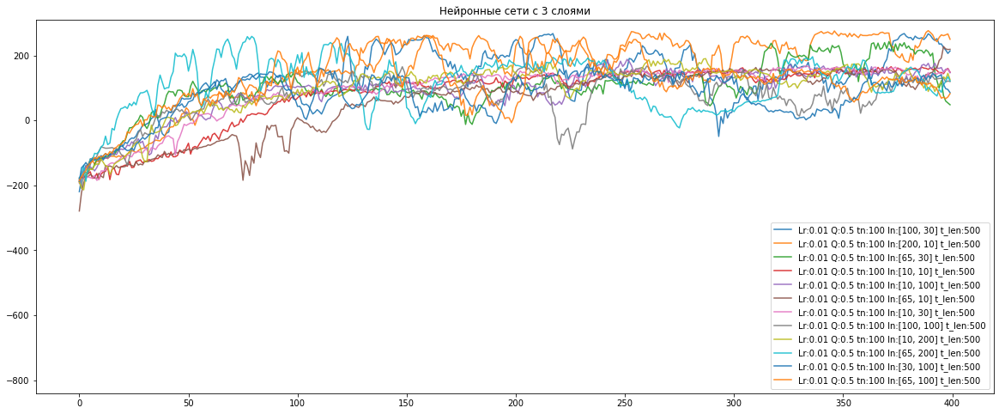

In [59]:
tdf = df.query('layers_cnt==2 and mean50_ed > 100  and finished and lr==0.01').sort_values('mean25_ed')
graph_data = []
filtered_list = tdf['id'].to_list()
for ed in sorted(data, key=lambda x:-last_mean(x['episode_data'], 25)):
    if not (ed['id'] in filtered_list): continue
    graph_data.append(ed)

    print(len(graph_data))
plt.figure(figsize=(20,8))

for i, ed in enumerate(graph_data):
#     print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    lable = f"Lr:{ed['lr']} Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
#     lable = f"Neurons in layers {ed['layers_n']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
leg = plt.legend(loc='lower right')
plt.title('Нейронные сети с 3 слоями')
plt.ylim((-840, 310))
plt.show()

1
2
3
4
5
6
7
8
9
10
11
12


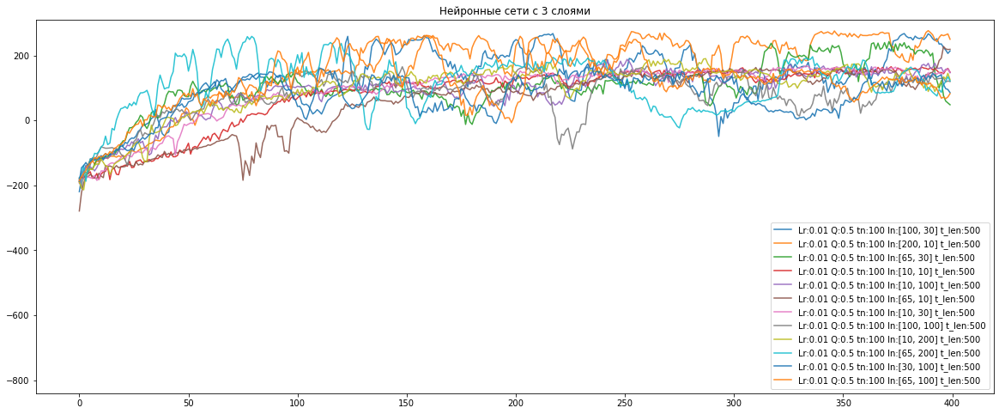

In [60]:
tdf = df.query('layers_cnt==2 and mean50_ed > 100  and finished and lr==0.01').sort_values('mean25_ed')
graph_data = []
filtered_list = tdf['id'].to_list()
for ed in sorted(data, key=lambda x:-last_mean(x['episode_data'], 25)):
    if not (ed['id'] in filtered_list): continue
    graph_data.append(ed)

    print(len(graph_data))
plt.figure(figsize=(20,8))

for i, ed in enumerate(graph_data):
#     print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    lable = f"Lr:{ed['lr']} Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
#     lable = f"Neurons in layers {ed['layers_n']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
leg = plt.legend(loc='lower right')
plt.title('Нейронные сети с 3 слоями')
plt.ylim((-840, 310))
plt.show()

1
2
3
4


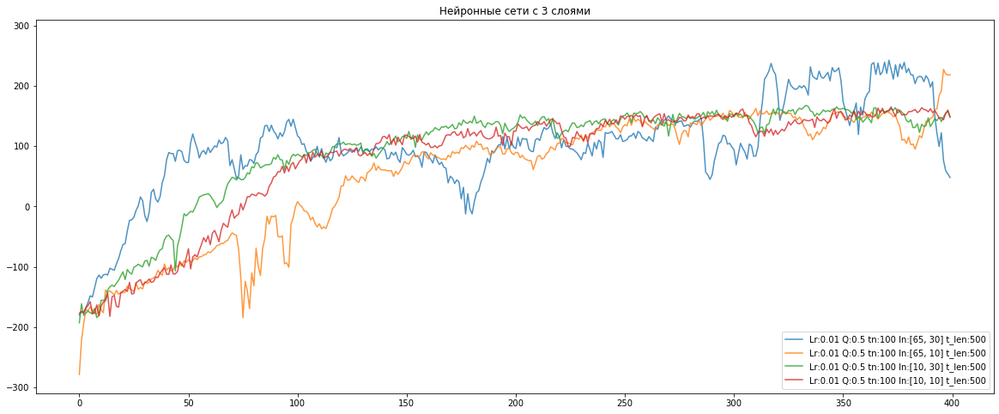

In [84]:
tdf = df.query('layers_cnt==2 and mean50_ed > 100  and finished and lr==0.01 and layers_n1<100 and layers_n2<100').sort_values('mean25_ed')
graph_data = []
filtered_list = tdf['id'].to_list()
_data = filter(lambda x:len(x['layers_n'])==2, data)
for ed in sorted(_data, key=lambda x:-(x['layers_n'][0]*100+x['layers_n'][1])):
    if not (ed['id'] in filtered_list): continue
    graph_data.append(ed)

    print(len(graph_data))
plt.figure(figsize=(20,8))

for i, ed in enumerate(graph_data):
#     print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    lable = f"Lr:{ed['lr']} Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
#     lable = f"Neurons in layers {ed['layers_n']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.8,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 4 else 'solid',
             label=lable)
leg = plt.legend(loc='lower right')
plt.title('Нейронные сети с 3 слоями')
plt.ylim((-310, 310))
plt.show()

1
2
3
4
5


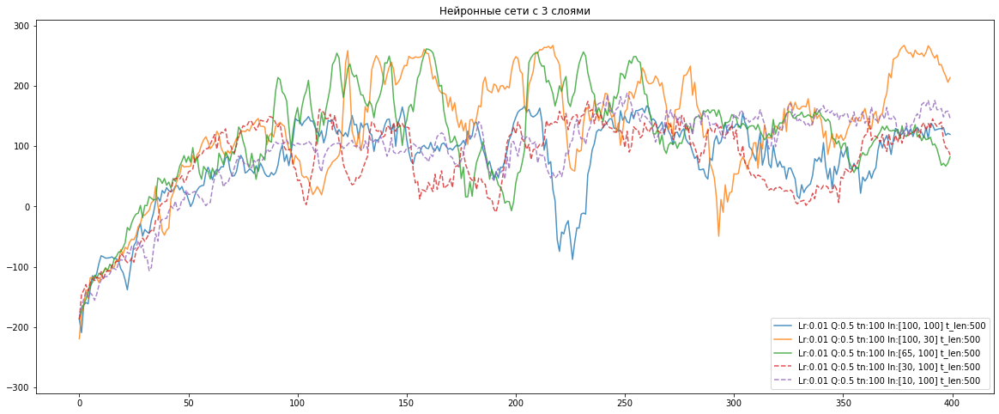

In [90]:
tdf = df.query('layers_cnt==2 and mean50_ed > 100  and finished and lr==0.01 and (layers_n1==100 or layers_n2==100)').sort_values('mean25_ed')
graph_data = []
filtered_list = tdf['id'].to_list()
_data = filter(lambda x:len(x['layers_n'])==2, data)
for ed in sorted(_data, key=lambda x:-(x['layers_n'][0]*100+x['layers_n'][1])):
    if not (ed['id'] in filtered_list): continue
    graph_data.append(ed)

    print(len(graph_data))
plt.figure(figsize=(20,8))

for i, ed in enumerate(graph_data):
#     print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    lable = f"Lr:{ed['lr']} Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
#     lable = f"Neurons in layers {ed['layers_n']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.8,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 2 else 'solid',
             label=lable)
leg = plt.legend(loc='lower right')
plt.title('Нейронные сети с 3 слоями')
plt.ylim((-310, 310))
plt.show()

1
2
3
4
5


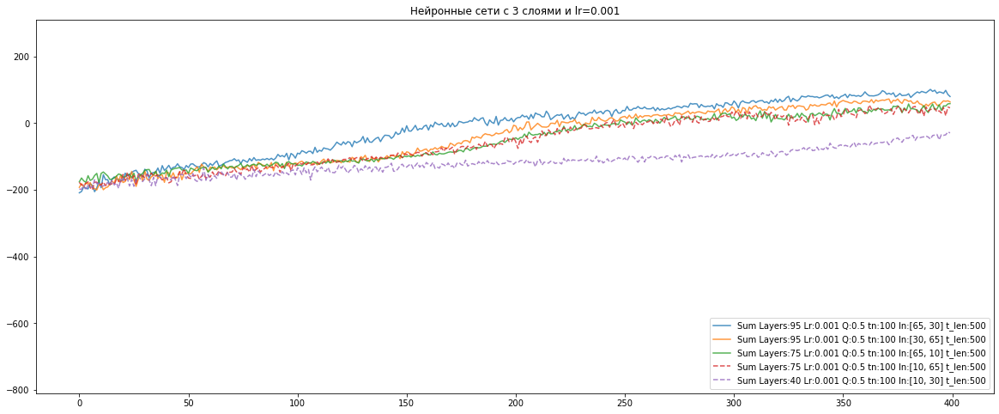

In [100]:
tdf = df.query('layers_cnt==2 and lr==0.001 and finished').sort_values('mean25_ed')
graph_data = []
filtered_list = tdf['id'].to_list()
_data = filter(lambda x:len(x['layers_n'])==2, data)
for ed in sorted(_data, key=lambda x: -last_mean(x['episode_data'],25)):
# for ed in sorted(_data, key=lambda x:-(x['layers_n'][0]*100+x['layers_n'][1])):
    if not (ed['id'] in filtered_list): continue
    graph_data.append(ed)

    print(len(graph_data))
plt.figure(figsize=(20,8))

for i, ed in enumerate(graph_data):
#     print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    lable = f"Sum Layers:{ed['layers_n'][0]+ed['layers_n'][1]} Lr:{ed['lr']} Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
#     lable = f"Neurons in layers {ed['layers_n']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.8,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 2 else 'solid',
             label=lable)
leg = plt.legend(loc='lower right')
plt.title('Нейронные сети с 3 слоями и lr=0.001')
plt.ylim((-810, 310))
plt.show()

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25


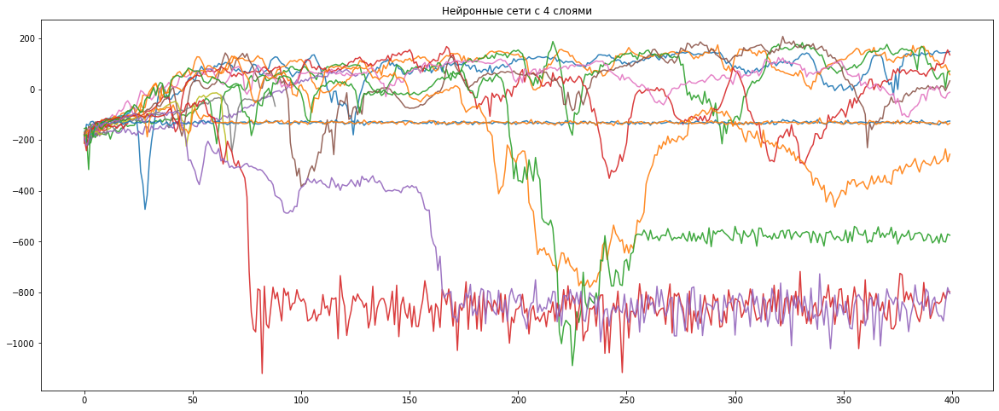

In [94]:
tdf = df.query('layers_cnt==3').sort_values('mean25_ed')
graph_data = []
filtered_list = tdf['id'].to_list()
for ed in sorted(data, key=lambda x:-last_mean(x['episode_data'], 25)):
    if not (ed['id'] in filtered_list): continue
    graph_data.append(ed)

    print(len(graph_data))
plt.figure(figsize=(20,8))

for i, ed in enumerate(graph_data):
#     print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    lable = f"Lr:{ed['lr']} Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
#     lable = f"Neurons in layers {ed['layers_n']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
# leg = plt.legend(loc='lower right')
plt.title('Нейронные сети с 4 слоями')
# plt.ylim((-840, 310))
plt.show()

In [254]:
10//2

5

In [278]:
color = [
    'lime','red','blue','orange', 'black','cyan']
list_styles = ['solid','dashed']

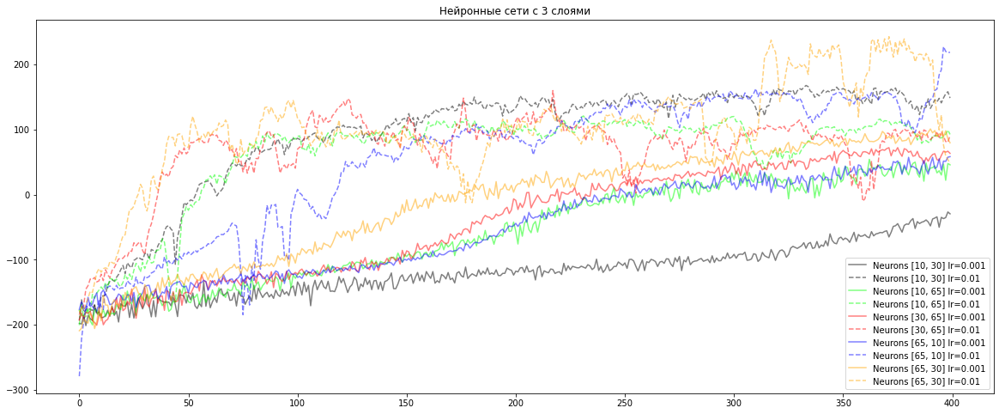

In [275]:
filtered_list =[
'62295221248791',
'2295221248791',
'62295244280154',
'2295244280154',
'62295405400446',
'2295405400446',
'62295516527882',
'2295516527882',
'62295544359654',
'2295544359654'
]
# tdf = df.query('layers_cnt==2 and finished')
# влияние размера одного слоя сети сети на  
# Q:0.5  tn:100 L:[...]
graph_data = []
# filtered_list = tdf['id'].to_list()
for ed in data:
#     if ed['q_param']!=0.5:continue
#     if ed['trajectory_n']!=150:continue
#     if len(ed['layers_n'])!=1:continue
    if not (ed['id'] in filtered_list): continue
    graph_data.append(ed)
graph_data = sorted(graph_data, key=lambda x:x['layers_n'][0]*100+x['layers_n'][1]+x['lr'])
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
#     print(ed['id'])
    episode_data = np.array(ed['episode_data'])
#     lable = f"Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    lable = f"Neurons {ed['layers_n']} lr={ed['lr']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             color = color[i//2-1],
             alpha=0.5,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = list_styles[i%2], # 'dashed' if i > 6 else 'solid',
             label=lable)
leg = plt.legend(loc='lower right')
plt.title('Нейронные сети с 3 слоями')
plt.show()

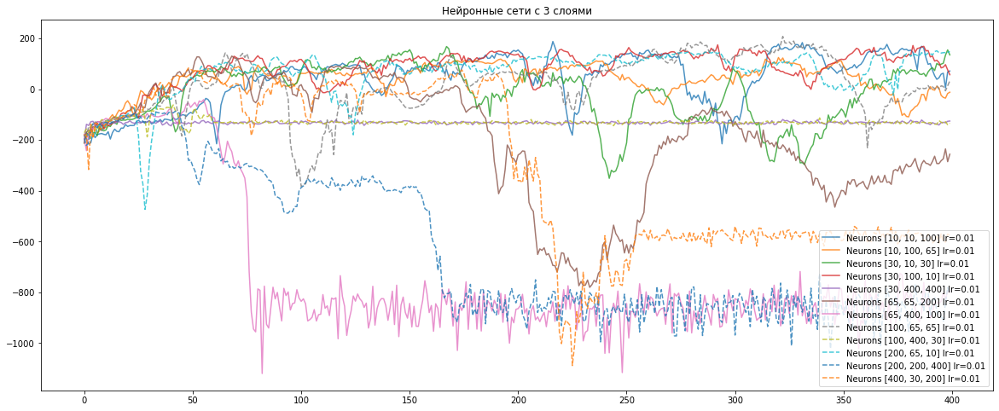

In [282]:
filtered_list =[
'2297580987042',
'2298168636587',
'2298818867762',
'2299521567332',
'2300232181546',
'2301029315447',
'2301869471853',
'2302782731016',
'2303752440811',
'2304749850198',
'2305845064115',
'2306968164056'
]
# tdf = df.query('layers_cnt==2 and finished')
# влияние размера одного слоя сети сети на  
# Q:0.5  tn:100 L:[...]
graph_data = []
# filtered_list = tdf['id'].to_list()
for ed in data:
#     if ed['q_param']!=0.5:continue
#     if ed['trajectory_n']!=150:continue
#     if len(ed['layers_n'])!=1:continue
    if not (ed['id'] in filtered_list): continue
    graph_data.append(ed)
graph_data = sorted(graph_data, key=lambda x:x['layers_n'][0]*100+x['layers_n'][1]+x['lr'])
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
#     print(ed['id'])
    episode_data = np.array(ed['episode_data'])
#     lable = f"Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    lable = f"Neurons {ed['layers_n']} lr={ed['lr']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
#              color = color[i//2-1],
             alpha=0.8,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
leg = plt.legend(loc='lower right')
plt.title('Нейронные сети с 3 слоями')
plt.show()

In [ ]:
THE BEST

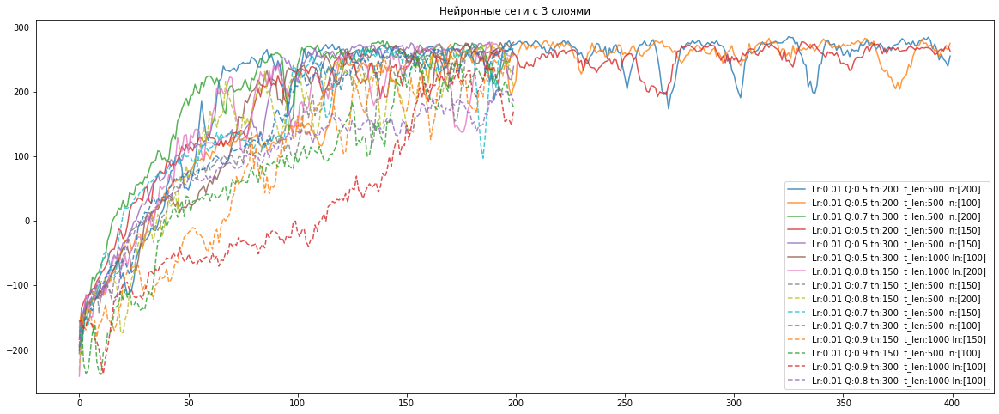

In [292]:
filtered_list =[
'2287523963825',
'2287208017163',
'2287819483353',
'2287789736369',
'2290748504803',
'2287465267159',
'2292098547091',
'2291950921733',
'2292024736000',
'2289621002049',
'2289603491094',
'2290109075800',
'2289524828615',
'2290092674916',
'2289569819764'
]

graph_data = []
# filtered_list = tdf['id'].to_list()
for ed in sorted(data, key=lambda x:-np.max(np.array(x['episode_data'])[::,0])):
#     if ed['q_param']!=0.5:continue
#     if ed['trajectory_n']!=150:continue
#     if len(ed['layers_n'])!=1:continue
    if not (ed['id'] in filtered_list): continue
    graph_data.append(ed)
# graph_data = sorted(graph_data, key=lambda x:x['layers_n'][0]*100+x['layers_n'][1]+x['lr'])
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
#     print(ed['id'])
    episode_data = np.array(ed['episode_data'])
#     lable = f"Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    lable = f"Lr:{ed['lr']} Q:{ed['q_param']} tn:{ed['trajectory_n']}  t_len:{ed['trajectory_len']} ln:{ed['layers_n']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
#              color = color[i//2-1],
             alpha=0.8,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
leg = plt.legend(loc='lower right')
plt.title('Нейронные сети с 3 слоями')
plt.show()

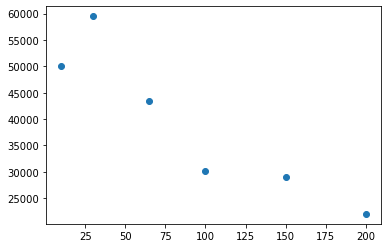

In [44]:
plt.scatter(tdf['layers_n1'], tdf['total_elapsed'])

влиние trajectory N

In [60]:
set(df['trajectory_n'])

{10, 50, 70, 100, 150, 200, 300}

In [59]:
tdf = df[(df['q_param']==0.5)&(df['layers_cnt']==1)&(df['finished'])&(df['trajectory_n']==200)]
tdf

,id,version,lr,episode_n,trajectory_n,trajectory_len,q_param,total_elapsed,finished,len_ed,mean25_ed,mean50_ed,std_ed,layers_cnt,layers_n1,layers_n2,layers_n3
0,2287189634114,1,0.010,200,150,500,0.7,14804.552606,True,200,222.531080,188.701615,44.634190,1,100,NaN,NaN
1,2287198420634,1,0.010,200,150,500,0.8,15014.121405,True,200,143.144873,142.460678,21.489821,1,100,NaN,NaN
2,2287208017163,1,0.010,200,150,500,0.9,9011.934088,True,200,216.145610,215.707191,20.699036,1,100,NaN,NaN
3,2287223764251,1,0.010,200,150,1000,0.7,26793.039190,True,200,144.686111,147.141633,11.668393,1,100,NaN,NaN
4,2287236024882,1,0.010,200,150,1000,0.8,29568.566618,True,200,95.526387,89.584672,20.789522,1,100,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185,62295221248791,6,0.001,400,100,500,0.5,4356.506295,True,400,-41.554626,-51.645662,12.089622,2,10,30.0,NaN
186,62295244280154,6,0.001,400,100,500,0.5,13717.566964,True,400,39.124110,37.291576,8.752752,2,10,65.0,NaN
187,62295405400446,6,0.001,400,100,500,0.5,17244.367211,True,400,61.335315,63.294527,5.445180,2,30,65.0,NaN
188,62295516527882,6,0.001,400,100,500,0.5,13168.849214,True,400,45.162522,42.079824,7.741852,2,65,10.0,NaN


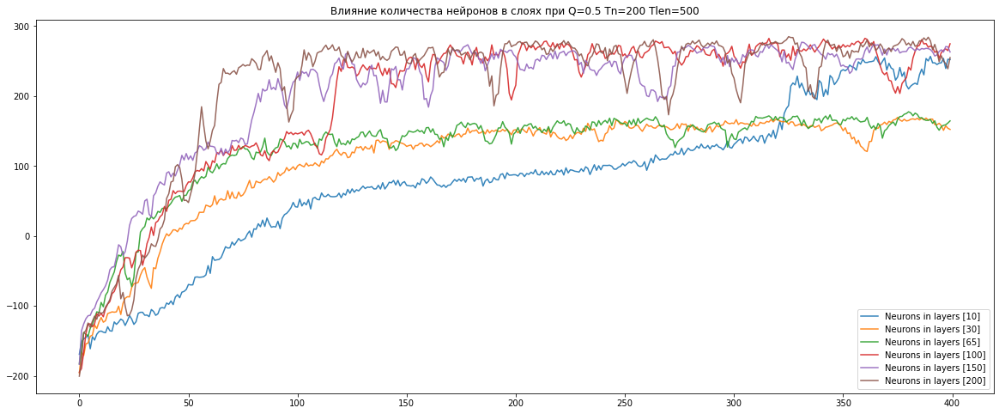

In [58]:
# влияние размера одного слоя сети сети на  
# Q:0.5  tn:100 L:[...]
graph_data = []
filtered_list = tdf['id'].to_list()
for ed in sorted(data, key=lambda x:x['layers_n'][0]):
#     if ed['q_param']!=0.5:continue
#     if ed['trajectory_n']!=150:continue
#     if len(ed['layers_n'])!=1:continue
    if not (ed['id'] in filtered_list): continue
    graph_data.append(ed)

plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
#     print(ed['id'])
    episode_data = np.array(ed['episode_data'])
#     lable = f"Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    lable = f"Neurons in layers {ed['layers_n']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
leg = plt.legend(loc='lower right')
plt.title('Влияние количества нейронов в слоях при Q=0.5 Tn=200 Tlen=500')
plt.show()

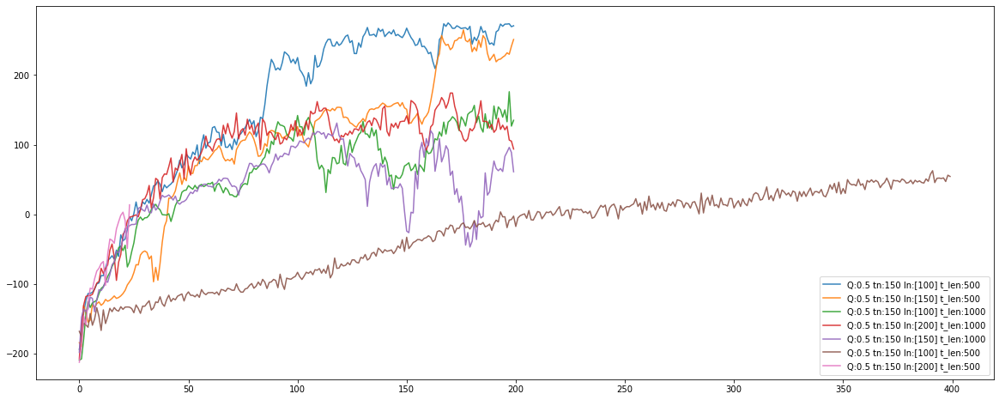

In [23]:
# влияние размера одного слоя сети сети на  
# Q:0.5  tn:100 L:[...]
graph_data = []
for ed in sorted(data, key=lambda x:-x['episode_data'][-1][0]):
    if ed['q_param']!=0.5:continue
    if ed['trajectory_n']!=150:continue
#     if len(ed['layers_n'])!=1:continue
    graph_data.append(ed)

plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
#     print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    lable = f"Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
    leg = plt.legend(loc='lower right')


2296081964952 Q:0.5 tn:100 ln:[400, 65] t_len:500
2295853834254 Q:0.5 tn:100 ln:[200, 10] t_len:500
2295516527882 Q:0.5 tn:100 ln:[65, 10] t_len:500
2295878666643 Q:0.5 tn:100 ln:[200, 30] t_len:500
2295712140124 Q:0.5 tn:100 ln:[100, 30] t_len:500
2295221248791 Q:0.5 tn:100 ln:[10, 30] t_len:500
2295195100690 Q:0.5 tn:100 ln:[10, 10] t_len:500
2296019840994 Q:0.5 tn:100 ln:[400, 10] t_len:500
2295269733941 Q:0.5 tn:100 ln:[10, 100] t_len:500
2295742016022 Q:0.5 tn:100 ln:[100, 65] t_len:500
2295295787581 Q:0.5 tn:100 ln:[10, 200] t_len:500
2295626802817 Q:0.5 tn:100 ln:[65, 200] t_len:500
2295773113254 Q:0.5 tn:100 ln:[100, 100] t_len:500
2295459840273 Q:0.5 tn:100 ln:[30, 200] t_len:500
2295961894236 Q:0.5 tn:100 ln:[200, 200] t_len:500
2295684743375 Q:0.5 tn:100 ln:[100, 10] t_len:500
2295905171078 Q:0.5 tn:100 ln:[200, 65] t_len:500
2295244280154 Q:0.5 tn:100 ln:[10, 65] t_len:500
2295405400446 Q:0.5 tn:100 ln:[30, 65] t_len:500
2295432360007 Q:0.5 tn:100 ln:[30, 100] t_len:500
229

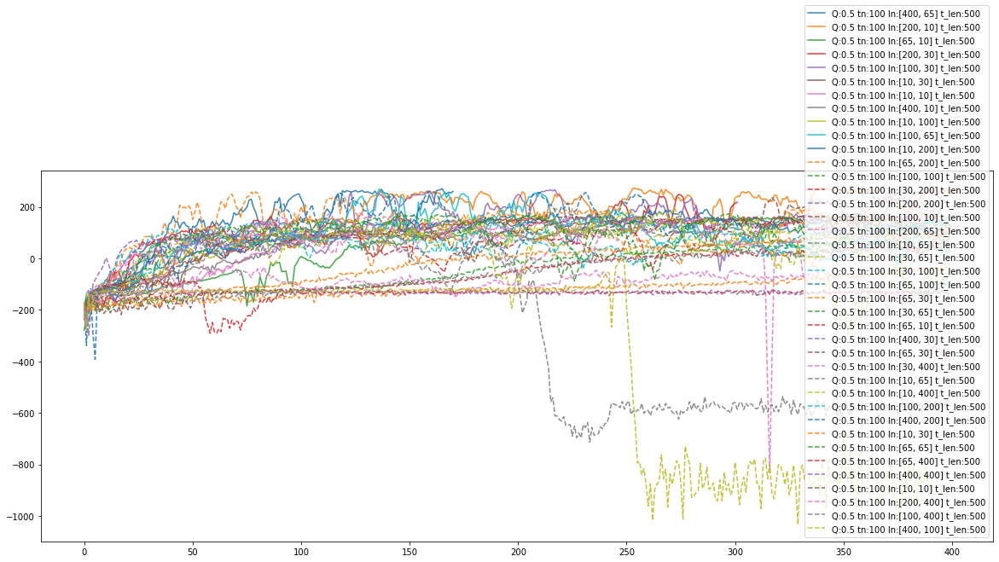

In [24]:
# влияние размера одного слоя сети сети на  
# Q:0.5  tn:100 L:[...]

# for group in sorted(groups):
graph_data = []
for ed in sorted(data, key=lambda x:-x['episode_data'][-1][0]):
#     if ed['q_param']!=0.5:continue
#     if ed['trajectory_n']!=150:continue
    if len(ed['layers_n'])!=2:continue
    graph_data.append(ed)

plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
#     print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    lable = f"Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    print(ed['id'], lable)

    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 10 else 'solid',
             label=lable)
leg = plt.legend(loc='lower right')


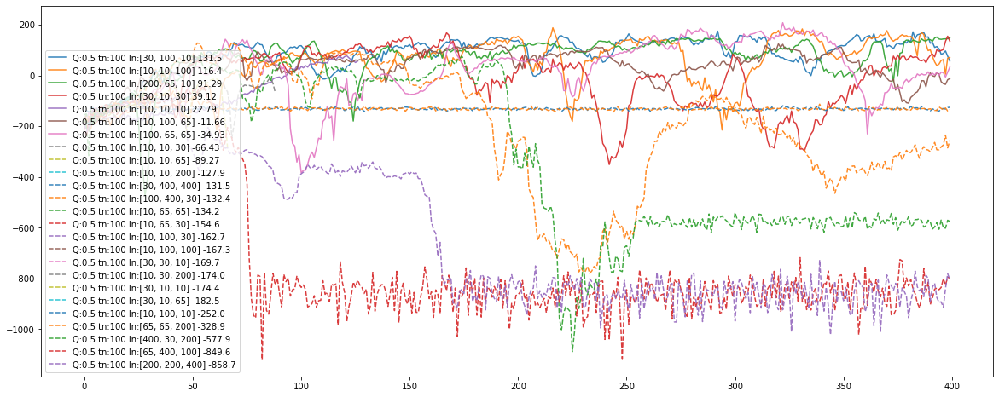

In [1025]:
# влияние размера одного слоя сети сети на  
# Q:0.5  tn:100 L:[...]

# for group in sorted(groups):
graph_data = []

for ed in sorted(data, key=lambda x:-last_mean(x['episode_data'],50)):
    if ed['q_param']!=0.5:continue
#     if ed['trajectory_n']!=150:continue
    if len(ed['layers_n'])!=3:continue
    graph_data.append(ed)

plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
#     print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    lable = f"Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} {last_mean(ed['episode_data'], 50):0.4}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
    leg = plt.legend(loc='lower left')


/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3420: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


2290748504803 Q:218.4, 0.7 tn:300 ln:[200] t_len:500
2287819483353 Q:180.4, 0.8 tn:150 ln:[200] t_len:1000
2287789736369 Q:164.2, 0.8 tn:150 ln:[200] t_len:500
2287465267159 Q:153.7, 0.7 tn:150 ln:[150] t_len:500
2290186107434 Q:139.0, 0.7 tn:300 ln:[150] t_len:1000
6412267369 Q:126.9, 0.7 tn:70 ln:[150] t_len:1000
2287189634114 Q:122.3, 0.7 tn:150 ln:[100] t_len:500
2290410650317 Q:114.4, 0.5 tn:50 ln:[200] t_len:500
2290206223614 Q:110.6, 0.8 tn:300 ln:[150] t_len:1000
2287523963825 Q:108.9, 0.9 tn:150 ln:[150] t_len:1000


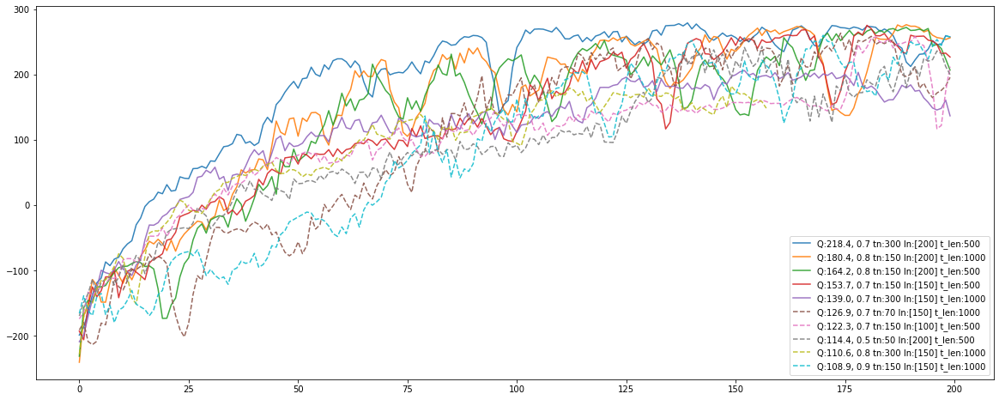

In [1026]:
# for group in sorted(groups):
graph_data = []
for ed in sorted(data, key=lambda x:-last_mean(x['episode_data'],-20)):
#     if ed['q_param']!=0.5:continue
    graph_data.append(ed)

graph_data = graph_data[:10]
    
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    episode_data = np.array(ed['episode_data'])
    lable = f"Q:{last_mean(ed['episode_data'],-20):0.4}, {ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    print(ed['id'], lable)
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 4 else 'solid',
             label=lable)
leg = plt.legend(loc='lower right')


2290748504803 255.8 Q:0.7 tn:300 ln:[200] t_len:500
2289524828615 253.5 Q:0.7 tn:300 ln:[100] t_len:500
2287465267159 236.9 Q:0.7 tn:150 ln:[150] t_len:500
6417427043 233.5 Q:0.7 tn:70 ln:[200] t_len:500
2290109075800 231.4 Q:0.7 tn:300 ln:[150] t_len:500
6412267369 222.4 Q:0.7 tn:70 ln:[150] t_len:1000
6418223916 210.5 Q:0.7 tn:70 ln:[200] t_len:1000
2287189634114 210.0 Q:0.7 tn:150 ln:[100] t_len:500
6416468866 201.6 Q:0.7 tn:50 ln:[200] t_len:1000
6402171926 191.1 Q:0.7 tn:50 ln:[100] t_len:500
2289586500297 176.6 Q:0.7 tn:300 ln:[100] t_len:1000
2290186107434 175.5 Q:0.7 tn:300 ln:[150] t_len:1000
2287501931245 164.0 Q:0.7 tn:150 ln:[150] t_len:1000
2287779104328 163.1 Q:0.7 tn:150 ln:[200] t_len:500
2287810209359 150.9 Q:0.7 tn:150 ln:[200] t_len:1000
2287223764251 145.8 Q:0.7 tn:150 ln:[100] t_len:1000
6409558227 127.7 Q:0.7 tn:50 ln:[150] t_len:1000
6410622380 127.5 Q:0.7 tn:70 ln:[150] t_len:500
6405068848 106.3 Q:0.7 tn:70 ln:[100] t_len:1000
6404142523 103.3 Q:0.7 tn:70 ln:[1

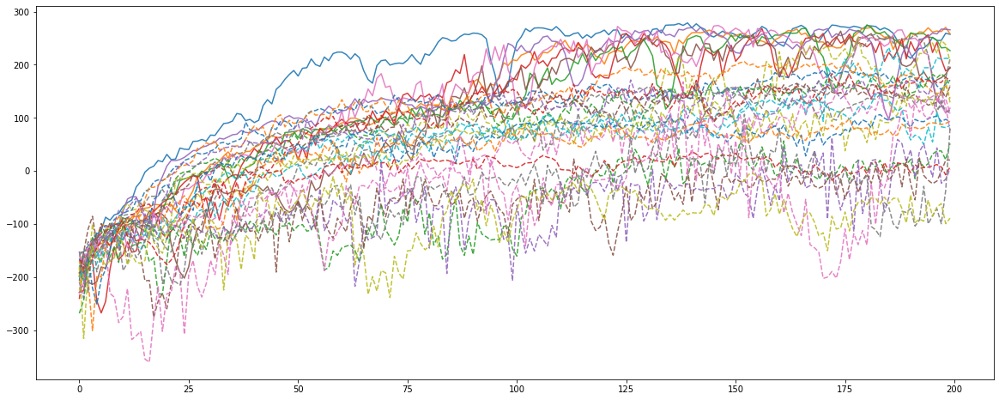

In [1027]:
# for group in sorted(groups):
graph_data = []
for ed in sorted(data, key=lambda x:-last_mean(x['episode_data'], 30)):
    if ed['q_param']!=0.7:continue
    graph_data.append(ed)


plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    episode_data = np.array(ed['episode_data'])
    lable = f"{last_mean(ed['episode_data'], 30):0.4} Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    print(ed['id'], lable)
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
#     leg = plt.legend(loc='lower right')


2287789736369 259.2 Q:0.8 tn:150 ln:[200] t_len:500
2287819483353 225.9 Q:0.8 tn:150 ln:[200] t_len:1000
6405310643 221.8 Q:0.8 tn:70 ln:[100] t_len:1000
6408837731 191.4 Q:0.8 tn:50 ln:[150] t_len:500
6416805880 181.7 Q:0.8 tn:50 ln:[200] t_len:1000
2289603491094 177.7 Q:0.8 tn:300 ln:[100] t_len:1000
2290206223614 160.8 Q:0.8 tn:300 ln:[150] t_len:1000
2287512694840 154.7 Q:0.8 tn:150 ln:[150] t_len:1000
2290128155630 154.4 Q:0.8 tn:300 ln:[150] t_len:500
2290766197475 150.0 Q:0.8 tn:300 ln:[200] t_len:500
2289538816485 147.5 Q:0.8 tn:300 ln:[100] t_len:500
2287198420634 139.7 Q:0.8 tn:150 ln:[100] t_len:500
2287475451152 138.6 Q:0.8 tn:150 ln:[150] t_len:500
6404474504 127.6 Q:0.8 tn:70 ln:[100] t_len:500
6411267961 121.4 Q:0.8 tn:70 ln:[150] t_len:500
6412649826 101.4 Q:0.8 tn:70 ln:[150] t_len:1000
2287236024882 96.27 Q:0.8 tn:150 ln:[100] t_len:1000
6417710910 94.7 Q:0.8 tn:70 ln:[200] t_len:500
6402388579 84.61 Q:0.8 tn:50 ln:[100] t_len:500
6403492914 57.57 Q:0.8 tn:50 ln:[100]

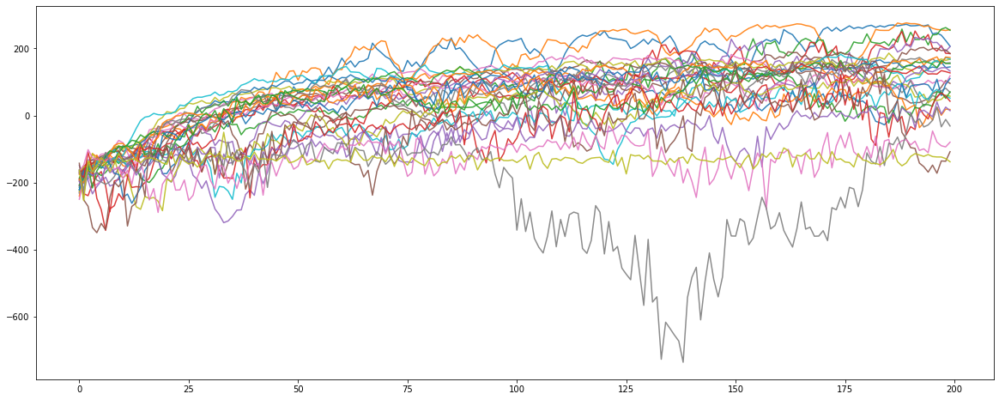

In [1028]:
# for group in sorted(groups):
graph_data = []
for ed in sorted(data, key=lambda x:-last_mean(x['episode_data'], 30)):
    if ed['q_param']!=0.8:continue
    graph_data.append(ed)

plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    episode_data = np.array(ed['episode_data'])
    lable = f"{last_mean(ed['episode_data'], 30):0.4} Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    print(ed['id'], lable)    
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
#     leg = plt.legend(loc='lower right')


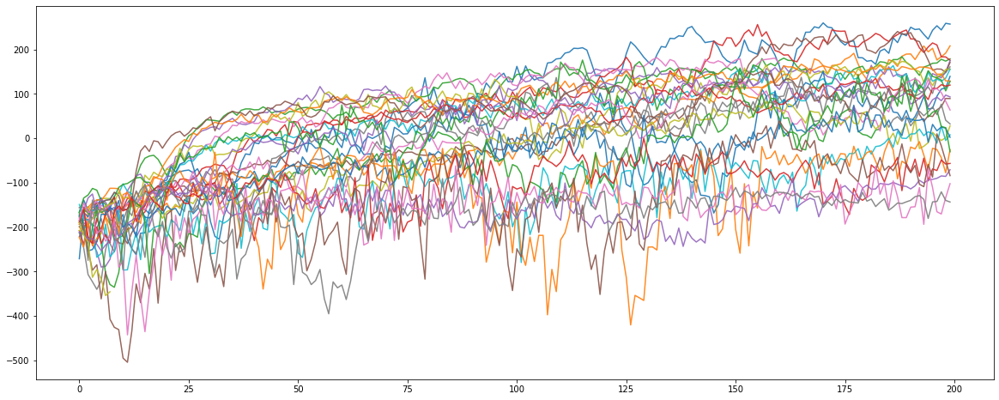

In [1029]:
# for group in sorted(groups):
graph_data = []
for ed in sorted(data, key=lambda x:-x['episode_data'][-1][0]):
    if ed['q_param']!=0.9:continue
    graph_data.append(ed)

plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
#     print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    lable = f"Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
#     leg = plt.legend(loc='lower right')


2289569819764
2289384530357
2290109075800
2289524828615
2290748504803
2287523963825
2287819483353


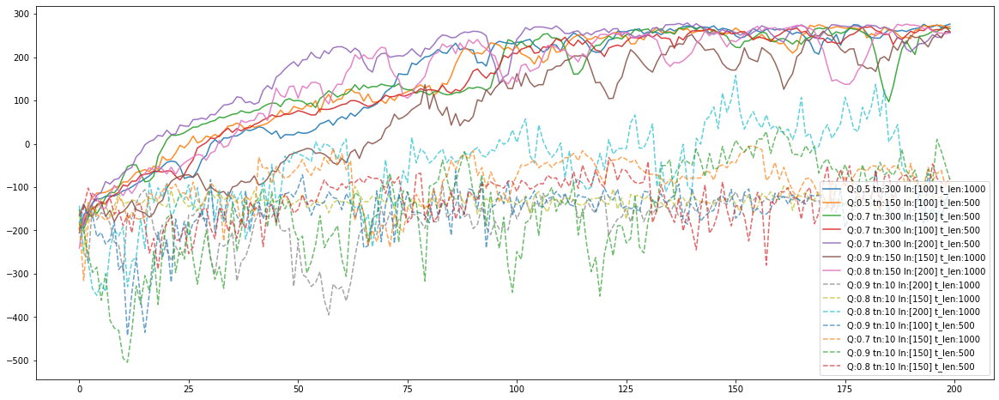

In [1030]:
# for group in sorted(groups):
graph_data = []
for ed in sorted(data, key=lambda x:-x['episode_data'][-1][0]):
# for ed in sorted(data, key=lambda x:-np.max(np.array(x['episode_data'])[::,0])):
#     print(len(ed['episode_data']))
    if len(ed['episode_data'])!=200:continue
#     if (#ed['trajectory_n']!= 640
#         ed['q_param'] != 0.9
#        ): continue
    graph_data.append(ed)

graph_data = graph_data[:7]
    
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    lable = f"Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
    leg = plt.legend(loc='lower right')

# plt.show()

# for group in sorted(groups):
graph_data = []
for ed in sorted(data, key=lambda x:x['episode_data'][-1][0]):
    if len(ed['episode_data'])!=200:continue

#     if (#ed['trajectory_n']!= 640
#         ed['q_param'] != 0.9
#        ): continue
    graph_data.append(ed)

graph_data = graph_data[:7]
    
# plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    episode_data = np.array(ed['episode_data'])
    lable = f"Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.7,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed',
             label=lable)
    leg = plt.legend(loc='lower right')

plt.show()

In [1038]:
best_of_the_best_mean25 = set(df.sort_values('mean25_ed', ascending=False).head(10)['id'])
best_of_the_best_mean50 = set(df.sort_values('mean50_ed', ascending=False).head(10)['id'])

In [1039]:
best_of_the_best_mean50,best_of_the_best_mean25

({'2287465267159',
  '2289384530357',
  '2289524828615',
  '2289569819764',
  '2290092674916',
  '2290748504803',
  '2291950921733',
  '2292024736000',
  '2292098547091',
  '2295853834254'},
 {'2287465267159',
  '2287789736369',
  '2289384530357',
  '2289524828615',
  '2289569819764',
  '2290092674916',
  '2290748504803',
  '2291950921733',
  '2292024736000',
  '2292098547091'})

2287465267159
2287789736369
2290748504803
2289384530357
2290092674916
2289524828615
2289569819764


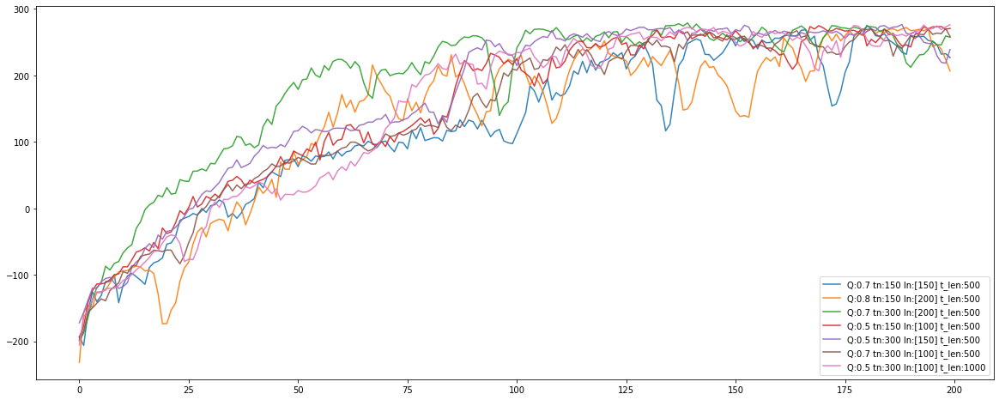

In [1042]:
# for group in sorted(groups):
graph_data = []
for ed in data:
    if not (ed['id'] in best_of_the_best_mean25): continue
    graph_data.append(ed)

graph_data = graph_data[:7]
    
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    lable = f"Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
    leg = plt.legend(loc='lower right')


2287465267159
2290748504803
2289384530357
2290092674916
2289524828615
2289569819764
2291950921733


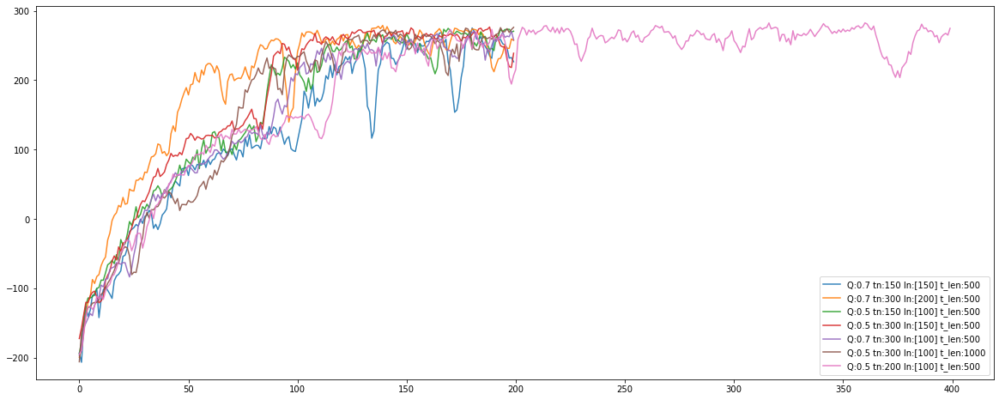

In [1043]:
# for group in sorted(groups):
graph_data = []
for ed in data:
    if not (ed['id'] in best_of_the_best_mean50): continue
    graph_data.append(ed)

graph_data = graph_data[:7]
    
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    lable = f"Q:{ed['q_param']} tn:{ed['trajectory_n']} ln:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
    leg = plt.legend(loc='lower right')


In [9]:
# Влияние trajectory_n на процесс обучение

6414439922
6400680881
6413509004
6407463479
6398894595
6405807355


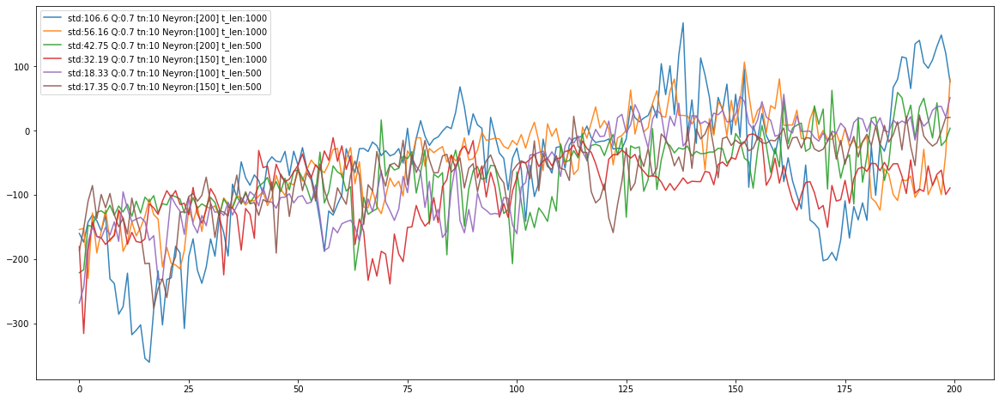

6418223916
6405068848
6412267369
6404142523
6417427043
6410622380


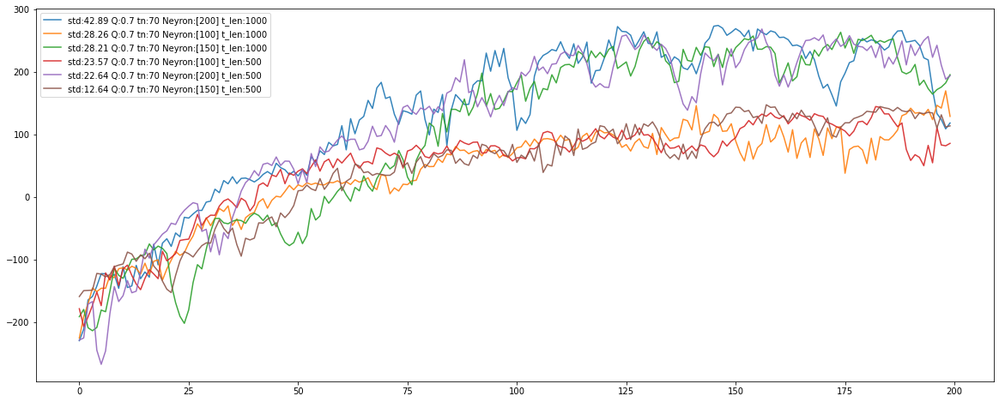

2290109075800
2290787295379
2289621002049
2290766197475
2289554170067
2290186107434
2289603491094
2290145630591
2290748504803
2289569819764
2289538816485
2290128155630
2290092674916
2289524828615
2289586500297


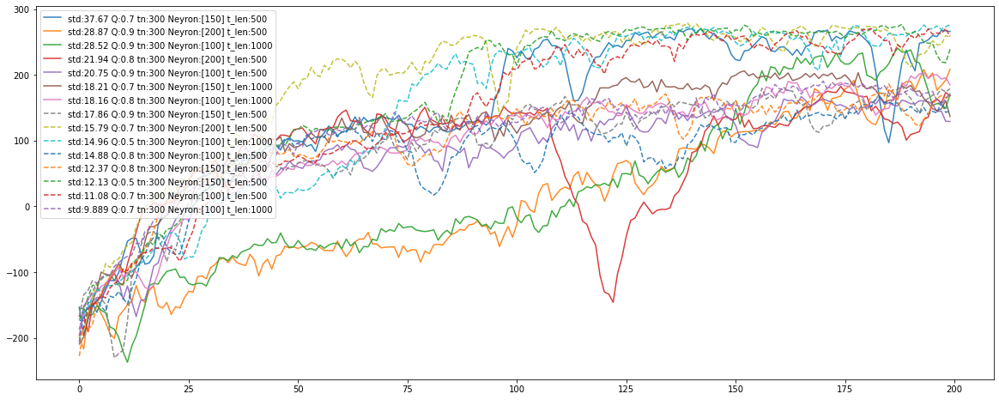

In [1044]:
# for group in sorted(groups):
graph_data = []
# for ed in  sorted(data, key=lambda x:x['layers_n']):
# for ed in sorted(data, key=lambda x:-np.max(np.array(x['episode_data'])[::,0][-20:])):
for ed in sorted(data, key=lambda x:-np.std(np.array(x['episode_data'])[::,0][-50:])):
    if len(ed['episode_data'])!=200:continue
    if (#ed['trajectory_len']!= 1000
        ed['trajectory_n']!=10
        or  ed['q_param'] != 0.7
        ): continue
    graph_data.append(ed)

# graph_data = graph_data[:7]
    
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    std = np.std(np.array(ed['episode_data'])[::,0][-50:])
    lable = f"std:{std:0.4} Q:{ed['q_param']} tn:{ed['trajectory_n']} Neyron:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
#     leg = plt.legend(loc='lower right')
    leg = plt.legend(loc='upper left')
plt.show()

# for group in sorted(groups):
graph_data = []
for ed in sorted(data, key=lambda x:-np.std(np.array(x['episode_data'])[::,0][-50:])):
    if len(ed['episode_data'])!=200:continue

    if (#ed['trajectory_len']!= 1000
        ed['trajectory_n']!=70
        or  ed['q_param'] != 0.7
        ): continue
    graph_data.append(ed)
    
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    std = np.std(np.array(ed['episode_data'])[::,0][-50:])
    lable = f"std:{std:0.4} Q:{ed['q_param']} tn:{ed['trajectory_n']} Neyron:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
#     leg = plt.legend(loc='lower right')
    leg = plt.legend(loc='upper left')
plt.show()

# for group in sorted(groups):
graph_data = []
for ed in sorted(data, key=lambda x:-np.std(np.array(x['episode_data'])[::,0][-50:])):
    if len(ed['episode_data'])!=200:continue
    if ed['trajectory_n']!=300: continue
    graph_data.append(ed)
    
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    std = np.std(np.array(ed['episode_data'])[::,0][-50:])
    lable = f"std:{std:0.4} Q:{ed['q_param']} tn:{ed['trajectory_n']} Neyron:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
#     leg = plt.legend(loc='lower right')
    leg = plt.legend(loc='upper left')
plt.show()

In [91]:
# чтобы сохранить низкую дисперсию в последних шагах, 
# нужно учеличивать пропорционально колво нейронов и кол-во тракеторий
layers_n = [[10], [30], [65], [100], [150], [200]]
episodes_n = [200]
trajectories_n = [50, 150, 300, ]
trajectories_len = [500]
q_params = [0.5]
versions=['2']

6416468866
6418223916
6405068848
6412267369
6409558227
2287810209359
2290186107434
2287501931245
2287223764251
6403149655
2289586500297


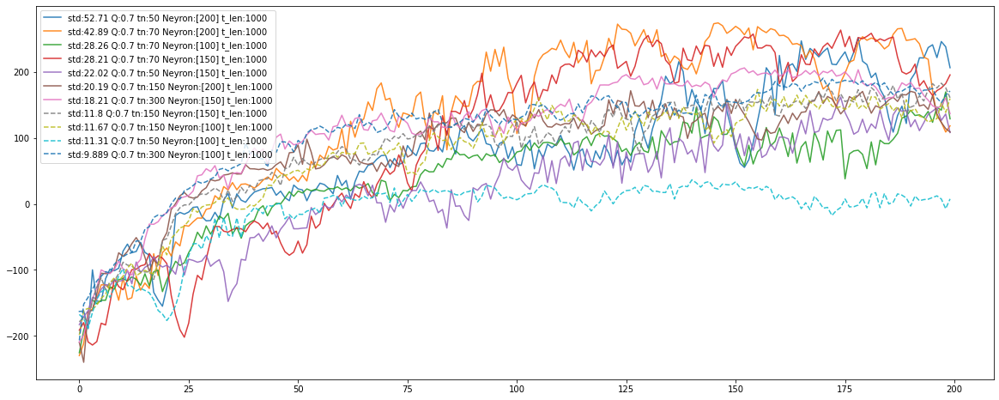

In [1045]:
# for group in sorted(groups):
graph_data = []
# for ed in  sorted(data, key=lambda x:x['layers_n']):
# for ed in sorted(data, key=lambda x:-np.max(np.array(x['episode_data'])[::,0][-20:])):
for ed in sorted(data, key=lambda x:-np.std(np.array(x['episode_data'])[::,0][-50:])):
    if len(ed['episode_data'])!=200:continue

    if (ed['trajectory_len']!= 1000
        or ed['trajectory_n']<11
        or  ed['q_param'] != 0.7
        ): continue
    graph_data.append(ed)

# graph_data = graph_data[:7]
    
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    std = np.std(np.array(ed['episode_data'])[::,0][-50:])
    lable = f"std:{std:0.4} Q:{ed['q_param']} tn:{ed['trajectory_n']} Neyron:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
#     leg = plt.legend(loc='lower right')
    leg = plt.legend(loc='upper left')

plt.show()

2290016002902
2289443530024
2290491284386
2289321180313
2289857879154
2290647408028
2289569819764


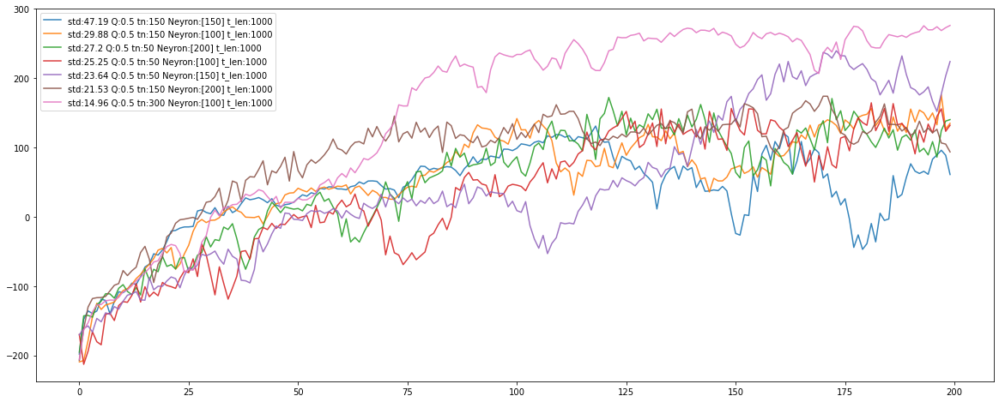

In [1046]:
# for group in sorted(groups):
graph_data = []
# for ed in  sorted(data, key=lambda x:x['layers_n']):
# for ed in sorted(data, key=lambda x:-np.max(np.array(x['episode_data'])[::,0][-20:])):
for ed in sorted(data, key=lambda x:-np.std(np.array(x['episode_data'])[::,0][-50:])):
    if len(ed['episode_data'])!=200:continue

    if (ed['trajectory_len']!= 1000
        or ed['trajectory_n']<11
        or  ed['q_param'] != 0.5
        ): continue
    graph_data.append(ed)

# graph_data = graph_data[:7]
    
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    std = np.std(np.array(ed['episode_data'])[::,0][-50:])
    lable = f"std:{std:0.4} Q:{ed['q_param']} tn:{ed['trajectory_n']} Neyron:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
#     leg = plt.legend(loc='lower right')
    leg = plt.legend(loc='upper left')

plt.show()

6416468866
6402171926
6409558227
6415384184
6403149655
6408496043


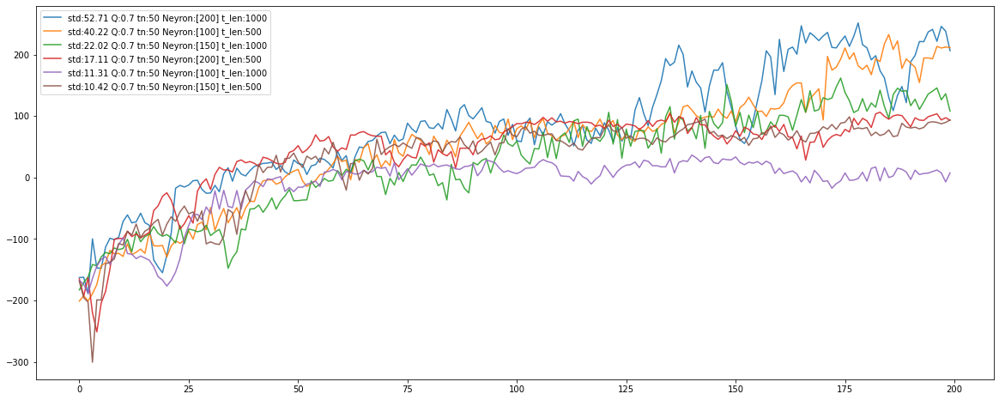

In [1047]:
# for group in sorted(groups):
graph_data = []
# for ed in  sorted(data, key=lambda x:x['layers_n']):
# for ed in sorted(data, key=lambda x:-np.max(np.array(x['episode_data'])[::,0][-20:])):
for ed in sorted(data, key=lambda x:-np.std(np.array(x['episode_data'])[::,0][-50:])):
    if (#ed['trajectory_len']!= 1000
         ed['trajectory_n']!=50
        or  ed['q_param'] != 0.7
        ): continue
    graph_data.append(ed)

# graph_data = graph_data[:7]
    
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    std = np.std(np.array(ed['episode_data'])[::,0][-50:])
    lable = f"std:{std:0.4} Q:{ed['q_param']} tn:{ed['trajectory_n']} Neyron:{ed['layers_n']} t_len:{ed['trajectory_len']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
#     leg = plt.legend(loc='lower right')
    leg = plt.legend(loc='upper left')

plt.show()

In [42]:
# я не знаю какие есть архитектуры для RL
# я знаю для CV
# ну в данном случае мы работаем как с табличными данными
# так что модели с линейными слоями нам подходят
# если мало двух слоев будет то добавим еще
# единственное я бы попробовал нормализовать данные
# хотя если сейчас значения в состояниях масштабированы
# то можно и без нормализации можно обойтись

# нормализация нужна когда у нас, например, одна переменная в состояниях принимает значения от 0 до 1,
# а другая переменная принимает значения от 100 до 1000
# естественно они будут вносить разный вклад в функцию ошибки
# следовательно нужно эти обе переменные привести к одному масштабу
# но я думаю нам до этого пока рано
# надо поиграться с тем что имеем сейчас

Графики сетей с большим количеством слоев

2295570656342 std:108.0 Q:0.5 Neyron:[65, 65], 100
2295990223883 std:104.1 Q:0.5 Neyron:[200, 400], 100
2295321839410 std:71.33 Q:0.5 Neyron:[10, 400], 100
2296110021230 std:63.84 Q:0.5 Neyron:[400, 100], 100
2295742016022 std:53.84 Q:0.5 Neyron:[100, 65], 100
2295712140124 std:52.45 Q:0.5 Neyron:[100, 30], 100
2295544359654 std:52.39 Q:0.5 Neyron:[65, 30], 100
2296081964952 std:49.23 Q:0.5 Neyron:[400, 65], 100
2295459840273 std:44.73 Q:0.5 Neyron:[30, 200], 100
2295878666643 std:43.41 Q:0.5 Neyron:[200, 30], 100
2296140644394 std:39.08 Q:0.5 Neyron:[400, 200], 100
2295488869908 std:38.93 Q:0.5 Neyron:[30, 400], 100
2295405400446 std:33.12 Q:0.5 Neyron:[30, 65], 100
2295626802817 std:32.93 Q:0.5 Neyron:[65, 200], 100
2295773113254 std:30.79 Q:0.5 Neyron:[100, 100], 100
2296050387854 std:30.56 Q:0.5 Neyron:[400, 30], 100
2295516527882 std:29.25 Q:0.5 Neyron:[65, 10], 100
2295853834254 std:28.09 Q:0.5 Neyron:[200, 10], 100
2295295787581 std:25.07 Q:0.5 Neyron:[10, 200], 100
229543236000

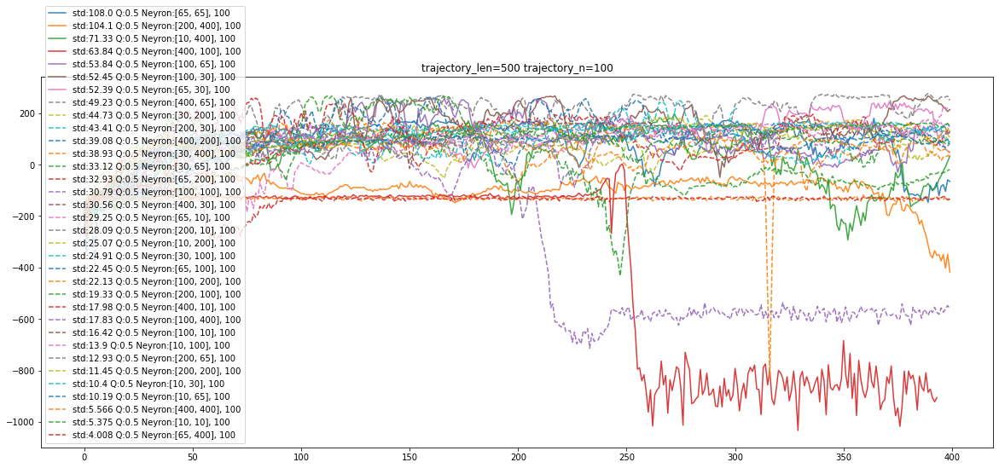

In [1048]:
# for group in sorted(groups):
graph_data = []
# for ed in  sorted(data, key=lambda x:x['layers_n']):
# for ed in sorted(data, key=lambda x:-np.max(np.array(x['episode_data'])[::,0][-20:])):
for ed in sorted(data, key=lambda x:-np.std(np.array(x['episode_data'])[::,0][-50:])):
    if (len(ed['layers_n'])!=2): continue
#     if (ed['trajectory_len']!= 1000
#         or ed['trajectory_n']<11
#         or  ed['q_param'] != 0.7
#         ): continue
    graph_data.append(ed)

# graph_data = graph_data[:7]
    
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    episode_data = np.array(ed['episode_data'])
    std = np.std(np.array(ed['episode_data'])[::,0][-50:])
    lable = f"std:{std:0.4} Q:{ed['q_param']} Neyron:{ed['layers_n']}, {ed['trajectory_n']}"
    print(ed['id'], lable)
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
#     leg = plt.legend(loc='lower right')
    leg = plt.legend(loc='lower left')
plt.title('trajectory_len=500 trajectory_n=100')
plt.show()

2302782731016
2298818867762
2301869471853
2304749850198
2305845064115
2298168636587
2301029315447
2297580987042
2299521567332
2306968164056
2303752440811
2300232181546


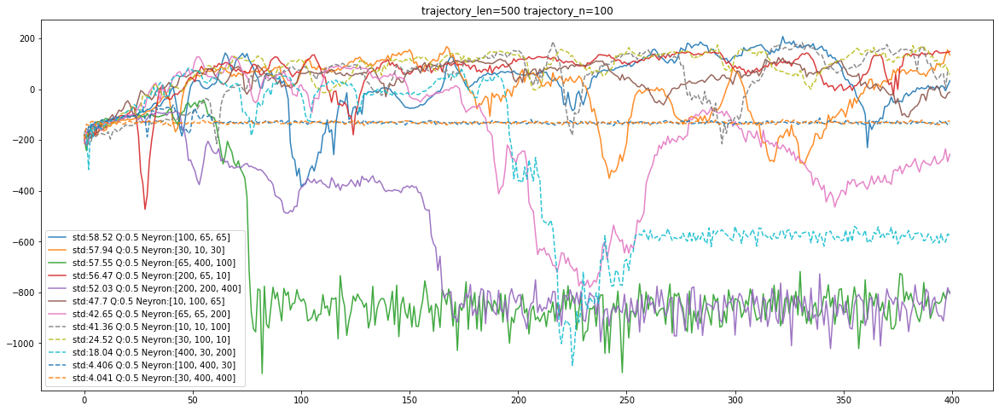

In [15]:
# for group in sorted(groups):
graph_data = []
# for ed in  sorted(data, key=lambda x:x['layers_n']):
# for ed in sorted(data, key=lambda x:-np.max(np.array(x['episode_data'])[::,0][-20:])):
for ed in sorted(data, key=lambda x:-np.std(np.array(x['episode_data'])[::,0][-50:])):
    if (len(ed['layers_n'])!=3): continue
#     if (ed['trajectory_len']!= 1000
#         or ed['trajectory_n']<11
#         or  ed['q_param'] != 0.7
#         ): continue
    graph_data.append(ed)

# graph_data = graph_data[:7]
    
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    std = np.std(np.array(ed['episode_data'])[::,0][-50:])
    lable = f"std:{std:0.4} Q:{ed['q_param']} Neyron:{ed['layers_n']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
#     leg = plt.legend(loc='lower right')
    leg = plt.legend(loc='lower left')
plt.title('trajectory_len=500 trajectory_n=100')
plt.show()

Learning rate candidates

2287189634114
2287198420634
2287208017163
2287465267159
2287475451152
2287488265106
2289935299829
2289384530357
2291950921733
2292024736000


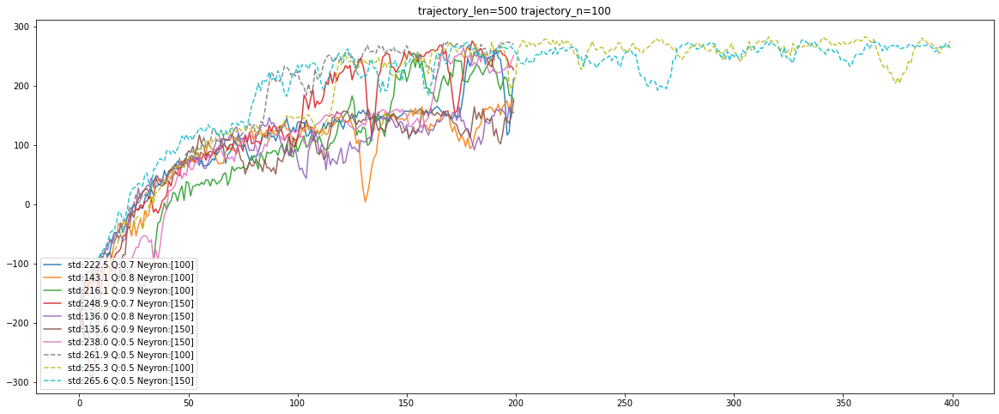

In [1049]:
lr_candidates = {'2289935299829',
'2289384530357',
'2287189634114',
'2287465267159',
'2287198420634',
'2287475451152',
'2287208017163',
'2287488265106','2291950921733',
'2292024736000'}

# for group in sorted(groups):
graph_data = []
# for ed in  sorted(data, key=lambda x:x['layers_n']):
# for ed in sorted(data, key=lambda x:-np.max(np.array(x['episode_data'])[::,0][-20:])):
for ed in data:
    if not (ed['id'] in lr_candidates): continue
#     if (ed['trajectory_len']!= 1000
#         or ed['trajectory_n']<11
#         or  ed['q_param'] != 0.7
#         ): continue
    graph_data.append(ed)
    
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    std = last_mean(ed['episode_data'], 25)
    lable = f"std:{std:0.4} Q:{ed['q_param']} Neyron:{ed['layers_n']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
#     leg = plt.legend(loc='lower right')
    leg = plt.legend(loc='lower left')
plt.title('trajectory_len=500 trajectory_n=100')
plt.show()

2291950921733
2292024736000


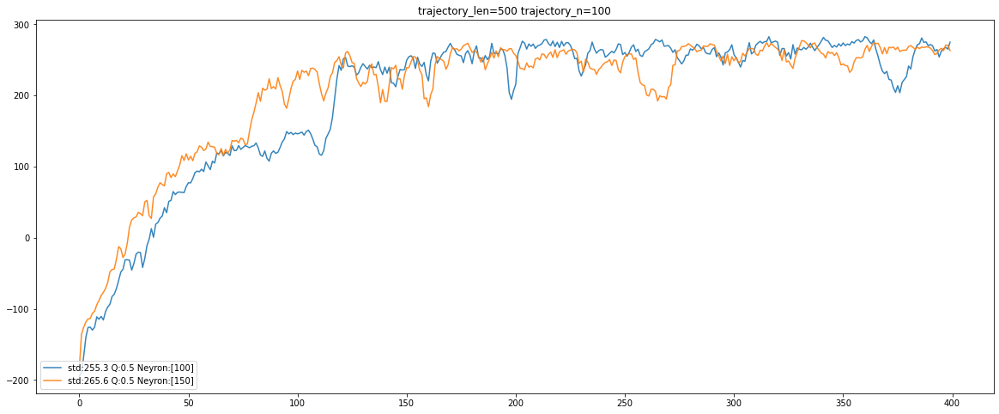

In [1050]:
lr_candidates = {'2291950921733',
'2292024736000'}

# for group in sorted(groups):
graph_data = []
# for ed in  sorted(data, key=lambda x:x['layers_n']):
# for ed in sorted(data, key=lambda x:-np.max(np.array(x['episode_data'])[::,0][-20:])):
for ed in data:
    if not (ed['id'] in lr_candidates): continue
#     if (ed['trajectory_len']!= 1000
#         or ed['trajectory_n']<11
#         or  ed['q_param'] != 0.7
#         ): continue
    graph_data.append(ed)
    
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    print(ed['id'])
    episode_data = np.array(ed['episode_data'])
    std = last_mean(ed['episode_data'], 25)
    lable = f"std:{std:0.4} Q:{ed['q_param']} Neyron:{ed['layers_n']}"
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
#     leg = plt.legend(loc='lower right')
    leg = plt.legend(loc='lower left')
plt.title('trajectory_len=500 trajectory_n=100')
plt.show()

2291757162014
2291817697935
2291879589435
2291950921733
2292024736000
2292098547091


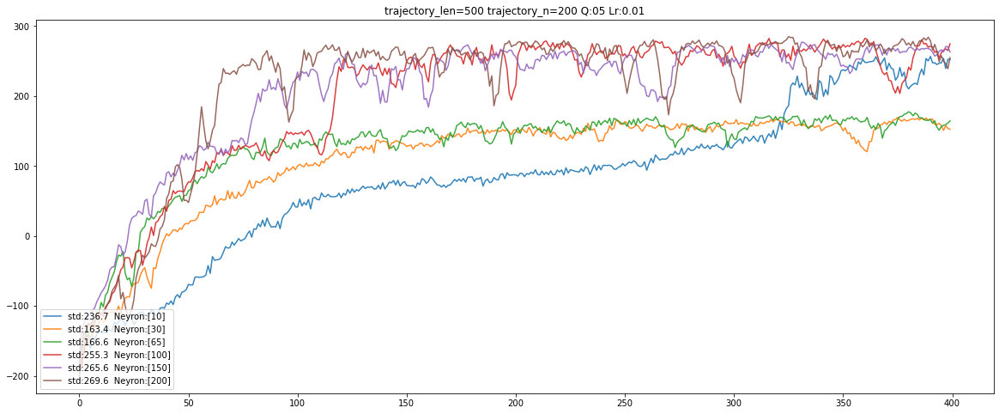

In [1051]:
lr_candidates = {
    
'2291757162014',
'2291817697935',
'2291879589435',
'2291950921733',
'2292024736000',
'2292098547091'}

# for group in sorted(groups):
graph_data = []
# for ed in  sorted(data, key=lambda x:x['layers_n']):
# for ed in sorted(data, key=lambda x:-np.max(np.array(x['episode_data'])[::,0][-20:])):
for ed in data:
    if not (ed['id'] in lr_candidates): continue
#     if (ed['trajectory_len']!= 1000
#         or ed['trajectory_n']<11
#         or  ed['q_param'] != 0.7
#         ): continue
    graph_data.append(ed)
    
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    episode_data = np.array(ed['episode_data'])
    std = last_mean(ed['episode_data'], 25)
    lable = f"std:{std:0.4}  Neyron:{ed['layers_n']}"
    print(ed['id'])
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
#     leg = plt.legend(loc='lower right')
    leg = plt.legend(loc='lower left')
plt.title('trajectory_len=500 trajectory_n=200 Q:05 Lr:0.01')
plt.show()

2290410650317 std:198.9  Neyron:[200]
2289384530357 std:261.9  Neyron:[100]
6417427043 std:231.0  Neyron:[200]
2289569819764 std:263.6  Neyron:[100]


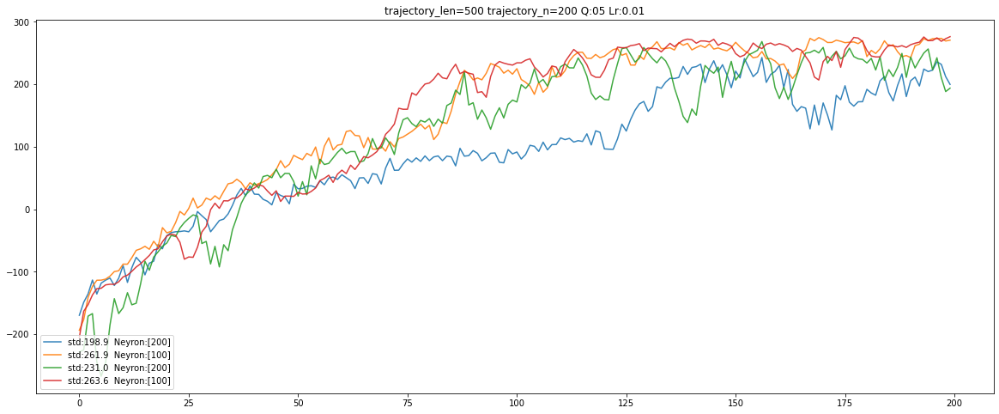

In [1064]:
lr_candidates = {
    
'2290410650317',
'6417427043',
'2289384530357',
'2289569819764'
}

# for group in sorted(groups):
graph_data = []
# for ed in  sorted(data, key=lambda x:x['layers_n']):
# for ed in sorted(data, key=lambda x:-np.max(np.array(x['episode_data'])[::,0][-20:])):
for ed in data:
    if not (ed['id'] in lr_candidates): continue
#     if (ed['trajectory_len']!= 1000
#         or ed['trajectory_n']<11
#         or  ed['q_param'] != 0.7
#         ): continue
    graph_data.append(ed)
    
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    episode_data = np.array(ed['episode_data'])
    std = last_mean(ed['episode_data'], 25)
    lable = f"std:{std:0.4}  Neyron:{ed['layers_n']}"
    print(ed['id'], lable)
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
#     leg = plt.legend(loc='lower right')
    leg = plt.legend(loc='lower left')
plt.title('trajectory_len=500 trajectory_n=200 Q:05 Lr:0.01')
plt.show()

2295544359654 mean:177.1  Neyron:[65, 30]
2295195100690 mean:155.9  Neyron:[10, 10]
2295516527882 mean:145.7  Neyron:[65, 10]
2295221248791 mean:143.2  Neyron:[10, 30]
2295244280154 mean:93.75  Neyron:[10, 65]
2295405400446 mean:91.79  Neyron:[30, 65]
2295570656342 mean:-89.97  Neyron:[65, 65]


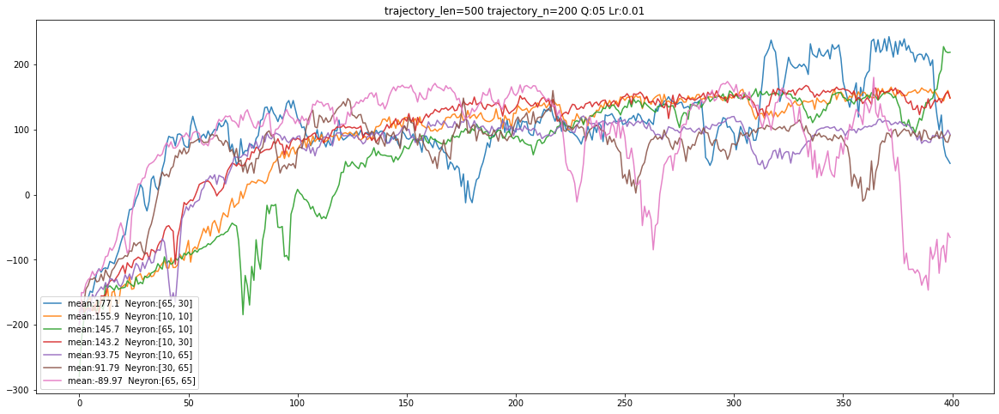

In [1077]:
lr_candidates = {
'2295244280154',
'2295195100690',
'2295221248791',
'2295405400446',
'2295516527882',
'2295544359654',
'2295570656342'
}

# for group in sorted(groups):
graph_data = []
# for ed in  sorted(data, key=lambda x:x['layers_n']):
# for ed in sorted(data, key=lambda x:-np.max(np.array(x['episode_data'])[::,0][-20:])):
for ed in sorted(data, key=lambda x:-last_mean(x['episode_data'],25)):
    if not (ed['id'] in lr_candidates): continue
#     if (ed['trajectory_len']!= 1000
#         or ed['trajectory_n']<11
#         or  ed['q_param'] != 0.7
#         ): continue
    graph_data.append(ed)
    
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    episode_data = np.array(ed['episode_data'])
    std = last_mean(ed['episode_data'], 25)
    lable = f"mean:{std:0.4}  Neyron:{ed['layers_n']}"
    print(ed['id'], lable)
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
#     leg = plt.legend(loc='lower right')
    leg = plt.legend(loc='lower left')
plt.title('trajectory_len=500 trajectory_n=200 Q:05 Lr:0.01')
plt.show()

In [103]:
from plotly.graph_objs.layout.scene import ZAxis, XAxis, YAxis
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import pandas as pd
from matplotlib import pyplot as plt
from IPython.core.display import display, HTML


In [104]:
import sklearn.preprocessing as pre 

/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/scipy/fft/__init__.py:97: DeprecationWarning: The module numpy.dual is deprecated.  Instead of using dual, use the functions directly from numpy or scipy.
  from numpy.dual import register_func
/home/shmalex/.conda/envs/py37/lib/python3.7/site-packages/scipy/special/orthogonal.py:81: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  from numpy import (exp, inf, pi, sqrt, floor, sin, cos, around, int,


In [105]:
ss = pre.StandardScaler()

In [106]:
def norms(a):
    mi = np.min(a)
    return (a-mi)/(np.max(a-mi))

0.06945162471253488

In [143]:
# for group in sorted(groups):
graph_data = []
graph_data_text = []
# for ed in  sorted(data, key=lambda x:x['layers_n']):
# for ed in sorted(data, key=lambda x:-np.max(np.array(x['episode_data'])[::,0][-20:])):
for ed in sorted(data, key=lambda x:-np.std(np.array(x['episode_data'])[::,0][-50:])):
#     if (len(ed['layers_n'])!=3): continue
    mean_reward = np.mean(np.array(ed['episode_data'])[::,0][-50:])
    
    graph_data.append([len(ed['layers_n'])+np.random.rand()/10, 
                       ed['q_param']+np.random.rand()/10,
                       ed['trajectory_n']+np.random.randint(10),
                       mean_reward])
    graph_data_text.append(f"Q:{ed['q_param']} Lr:{ed['layers_n']} Tn:{ed['trajectory_n']} Mr:{mean_reward:0.4}")
    
graph_data
graph_data = np.array(graph_data)



graph_data = np.array(graph_data)


# LAB
points1 = go.Scatter3d(
    x=graph_data[::,0], #Layers_n
    y=graph_data[::,1], # Q_param
    z=graph_data[::,2], # traj n
    text=graph_data_text,
    mode='markers',
    marker=dict(
        sizemode='diameter',
        size=norms(graph_data[::,3])*40,
        opacity =  0.5,
        color = ['green' if mr>50 else 'red' for mr in  graph_data[::,3]]
#         colorscale = 'Viridis',
#         colorbar_title = 'Life<br>Expectancy',
    )
    ,
)


fig = go.Figure(data=[ points1])

fig.update_scenes(xaxis_title_text='LayersN',
                  yaxis_title_text='Q Param',
                  zaxis_title_text='Trajectory N')
fig.layout.update(height=1000, width=1000,overwrite=True,
                  title='')

fig.show()
fig.write_html("report_2-1-1.html")

In [134]:

graph_data = np.array(graph_data)


# LAB
points1 = go.Scatter3d(
    x=graph_data[::,0], #Layers_n
    y=graph_data[::,1], # Q_param
    z=graph_data[::,2], # traj n
    text=graph_data_text,
    mode='markers',
    marker=dict(
        sizemode='diameter',
        size=norms(graph_data[::,3])*40,
        opacity =  0.5,
        color = ['green' if mr>50 else 'red' for mr in  graph_data[::,3]]
#         colorscale = 'Viridis',
#         colorbar_title = 'Life<br>Expectancy',
    )
    ,
)


fig = go.Figure(data=[ points1])

fig.update_scenes(xaxis_title_text='LayersN',
                  yaxis_title_text='Q Param',
                  zaxis_title_text='Trajectory N')
fig.layout.update(height=1000, width=1000,overwrite=True,
                  title='')

fig.show()
fig.write_html("report_1.html")

In [144]:
# for group in sorted(groups):
graph_data = []
graph_data_text = []
# for ed in  sorted(data, key=lambda x:x['layers_n']):
# for ed in sorted(data, key=lambda x:-np.max(np.array(x['episode_data'])[::,0][-20:])):
for ed in sorted(data, key=lambda x:-np.std(np.array(x['episode_data'])[::,0][-50:])):
#     if (len(ed['layers_n'])!=3): continue
    mean_reward = np.mean(np.array(ed['episode_data'])[::,0][-50:])
    
    graph_data.append([ ed['q_param'],#+np.random.rand()/10,
                       ed['trajectory_n'],#+np.random.randint(10),
                       mean_reward,
                       mean_reward])
    graph_data_text.append(f"Q:{ed['q_param']} Lr:{ed['layers_n']} Tn:{ed['trajectory_n']} Mr:{mean_reward:0.4}")
    
graph_data
graph_data = np.array(graph_data)



graph_data = np.array(graph_data)


# LAB
points1 = go.Scatter3d(
    x=graph_data[::,0], #Layers_n
    y=graph_data[::,1], # Q_param
    z=graph_data[::,2], # traj n
    text=graph_data_text,
    mode='markers',
    marker=dict(
        sizemode='diameter',
        size=norms(graph_data[::,3])*40,
        opacity =  0.5,
        color = ['green' if mr>50 else 'red' for mr in  graph_data[::,3]]
#         colorscale = 'Viridis',
#         colorbar_title = 'Life<br>Expectancy',
    )
    ,
)


fig = go.Figure(data=[ points1])

fig.update_scenes(xaxis_title_text='Q Param',
                  yaxis_title_text='Trajectory N',
                  zaxis_title_text='Mean Reward')
fig.layout.update(height=1000, width=1000,overwrite=True,
                  title='')

fig.show()
fig.write_html("report_2-1-2.html")

In [213]:
# fdf = df.query('finished and std_ed < 40 and meaned > 100 and mean50_ed > 150 and maxed>200')
# fdf = df.query('finished and std_ed < 50 and min70>256 and meaned > 120 and mean50_ed > 150 and maxed>200')
fdf = df.query('min70>200')
fdf

,id,version,lr,episode_n,trajectory_n,trajectory_len,q_param,total_elapsed,finished,len_ed,...,min70,meaned,mean200_ed,mean25_ed,mean50_ed,std_ed,layers_cnt,layers_n1,layers_n2,layers_n3
44,2290748504803,1,0.01,200,300,500,0.7,11197.604180,True,200,...,212.244635,189.333586,189.333586,253.278272,255.932590,15.792391,1,200,NaN,NaN
69,2289384530357,1,0.01,200,150,500,0.5,8044.215785,True,200,...,209.261256,154.109500,154.109500,261.945072,256.295844,15.899406,1,100,NaN,NaN
80,2290092674916,1,0.01,200,300,500,0.5,13431.681405,True,200,...,218.324021,167.132053,167.132053,258.064933,261.404808,12.125584,1,150,NaN,NaN
119,2289524828615,1,0.01,200,300,500,0.7,15543.779846,True,200,...,220.501194,143.051859,143.051859,257.211539,252.912292,11.076982,1,100,NaN,NaN
122,2289569819764,1,0.01,200,300,1000,0.5,19451.925294,True,200,...,206.826214,149.883389,149.883389,263.598279,256.169142,14.964869,1,100,NaN,NaN
128,2291950921733,2,0.01,400,200,500,0.5,30139.205586,True,400,...,203.808920,197.954889,133.422447,255.304107,256.753822,23.089123,1,100,NaN,NaN
130,2292024736000,2,0.01,400,200,500,0.5,28958.114572,True,400,...,232.392315,206.390981,159.069289,265.589053,262.010732,9.526486,1,150,NaN,NaN


In [219]:
fdf[['lr','episode_n','trajectory_n',
     'trajectory_len','q_param','layers_cnt',
     'layers_n1','layers_n2','layers_n3']].reset_index()

,index,lr,episode_n,trajectory_n,trajectory_len,q_param,layers_cnt,layers_n1,layers_n2,layers_n3
0,44,0.01,200,300,500,0.7,1,200,NaN,NaN
1,69,0.01,200,150,500,0.5,1,100,NaN,NaN
2,80,0.01,200,300,500,0.5,1,150,NaN,NaN
3,119,0.01,200,300,500,0.7,1,100,NaN,NaN
4,122,0.01,200,300,1000,0.5,1,100,NaN,NaN
5,128,0.01,400,200,500,0.5,1,100,NaN,NaN
6,130,0.01,400,200,500,0.5,1,150,NaN,NaN


2290748504803  Q:0.7 Tn:300 Tl:500 Neyron:[200] 139
2290092674916  Q:0.5 Tn:300 Tl:500 Neyron:[150] 188
2292024736000  Q:0.5 Tn:200 Tl:500 Neyron:[150] 178
2289384530357  Q:0.5 Tn:150 Tl:500 Neyron:[100] 169
2289569819764  Q:0.5 Tn:300 Tl:1000 Neyron:[100] 199
2289524828615  Q:0.7 Tn:300 Tl:500 Neyron:[100] 198
2291950921733  Q:0.5 Tn:200 Tl:500 Neyron:[100] 189


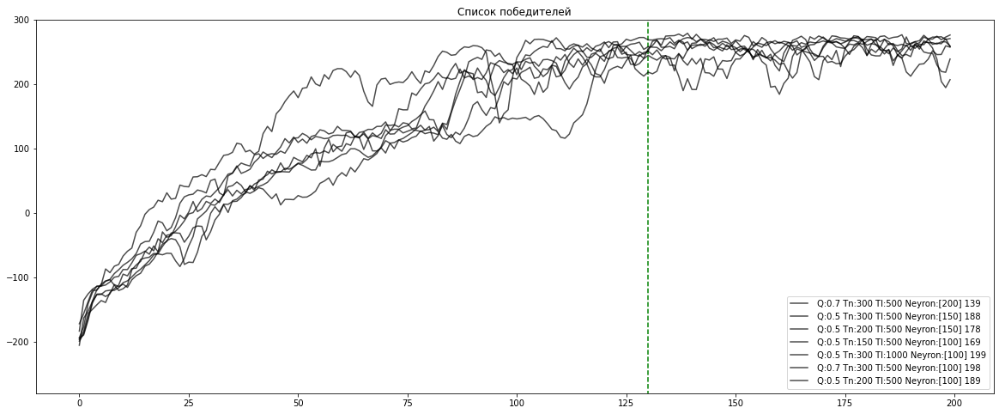

In [220]:

lr_candidates =fdf['id'].tolist()

graph_data = []
# for ed in sorted(data, key=lambda x:-np.max(np.array(x['episode_data'])[::,0][-20:])):
for ed in sorted(data, key=lambda x:-np.mean(np.array(x['episode_data'])[::,0][:200])):
    if not (ed['id'] in lr_candidates): continue
    graph_data.append(ed)
    
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    episode_data = np.array(ed['episode_data'])[:200]
    d = np.array(ed['episode_data'])[::,0][:200]
    m = np.mean(d)
    lable = f" Q:{ed['q_param']} Tn:{ed['trajectory_n']} Tl:{ed['trajectory_len']} Neyron:{ed['layers_n']} {np.argmax(d)}"
    print(ed['id'], lable)
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.7,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
#              linestyle = 'dashed' if i > 6 else 'solid',
             color = 'black',
             label=lable)
#     leg = plt.legend(loc='lower right')
    leg = plt.legend(loc='lower right')
plt.vlines(130, -400, 500, color='green',linestyles='dashed')
plt.title('Список победителей')
plt.ylim((-280, 300))

plt.show()

2290748504803 mean:189.3  Neyron:[200] 139
2292098547091 mean:166.8  Neyron:[200] 197
2292024736000 mean:159.1  Neyron:[150] 178
6418223916 mean:134.1  Neyron:[200] 146
2291950921733 mean:133.4  Neyron:[100] 189


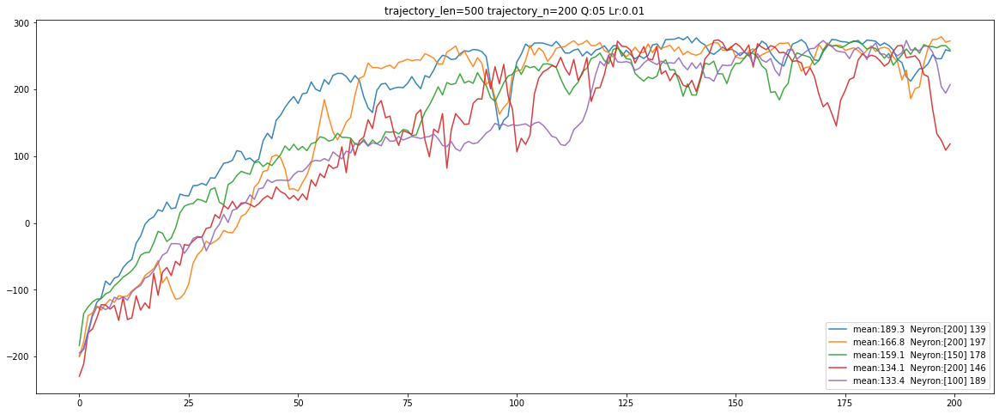

In [161]:
lr_candidates = {
'2292098547091',
'2292024736000',
'2291950921733',
'2290748504803',
    '6418223916'
}

graph_data = []
# for ed in sorted(data, key=lambda x:-np.max(np.array(x['episode_data'])[::,0][-20:])):
for ed in sorted(data, key=lambda x:-np.mean(np.array(x['episode_data'])[::,0][:200])):
    if not (ed['id'] in lr_candidates): continue
    graph_data.append(ed)
    
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    episode_data = np.array(ed['episode_data'])[:200]
    d = np.array(ed['episode_data'])[::,0][:200]
    m = np.mean(d)
    lable = f"mean:{m:0.4}  Neyron:{ed['layers_n']} {np.argmax(d)}"
    print(ed['id'], lable)
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
#     leg = plt.legend(loc='lower right')
    leg = plt.legend(loc='lower right')
plt.title('trajectory_len=500 trajectory_n=200 Q:05 Lr:0.01')
plt.show()

2290748504803 mean:189.3  Neyron:[200] 139
2292098547091 mean:166.8  Neyron:[200] 197
2292024736000 mean:159.1  Neyron:[150] 178
6418223916 mean:134.1  Neyron:[200] 146
2291950921733 mean:133.4  Neyron:[100] 189


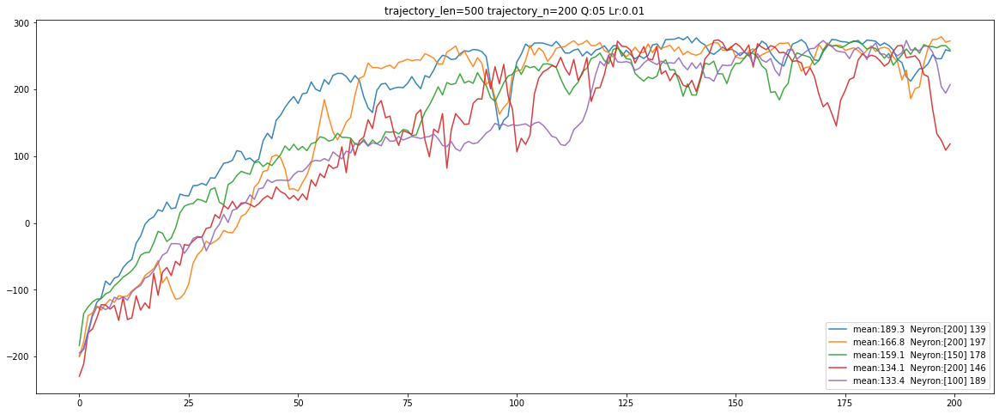

In [161]:
lr_candidates = {
'2292098547091',
'2292024736000',
'2291950921733',
'2290748504803',
    '6418223916'
}

graph_data = []
# for ed in sorted(data, key=lambda x:-np.max(np.array(x['episode_data'])[::,0][-20:])):
for ed in sorted(data, key=lambda x:-np.mean(np.array(x['episode_data'])[::,0][:200])):
    if not (ed['id'] in lr_candidates): continue
    graph_data.append(ed)
    
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    episode_data = np.array(ed['episode_data'])[:200]
    d = np.array(ed['episode_data'])[::,0][:200]
    m = np.mean(d)
    lable = f"mean:{m:0.4}  Neyron:{ed['layers_n']} {np.argmax(d)}"
    print(ed['id'], lable)
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
#     leg = plt.legend(loc='lower right')
    leg = plt.legend(loc='lower right')
plt.title('trajectory_len=500 trajectory_n=200 Q:05 Lr:0.01')
plt.show()

6418223916 mean:134.1  Neyron:[200] 146
6417427043 mean:124.0  Neyron:[200] 156
6412267369 mean:100.7  Neyron:[150] 174


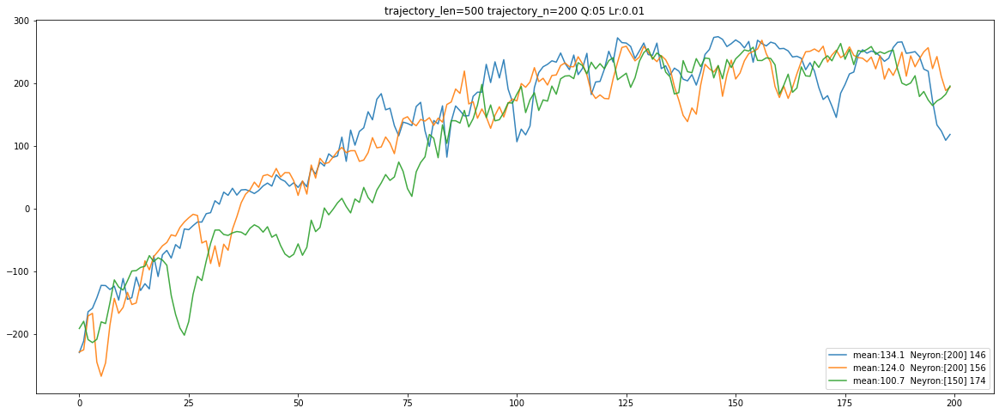

In [162]:
lr_candidates = {
'6418223916',
'6417427043',
'6412267369'
}

graph_data = []
# for ed in sorted(data, key=lambda x:-np.max(np.array(x['episode_data'])[::,0][-20:])):
for ed in sorted(data, key=lambda x:-np.mean(np.array(x['episode_data'])[::,0][:200])):
    if not (ed['id'] in lr_candidates): continue
    graph_data.append(ed)
    
plt.figure(figsize=(20,8))
for i, ed in enumerate(graph_data):
    episode_data = np.array(ed['episode_data'])[:200]
    d = np.array(ed['episode_data'])[::,0][:200]
    m = np.mean(d)
    lable = f"mean:{m:0.4}  Neyron:{ed['layers_n']} {np.argmax(d)}"
    print(ed['id'], lable)
    plt.plot(range(len(episode_data)), 
             episode_data[::,0],
             alpha=0.9,#.9 if d['q_param'] == 0.9 else .9 ,
#              linestyle=listyles[ed['type']],
             linestyle = 'dashed' if i > 6 else 'solid',
             label=lable)
#     leg = plt.legend(loc='lower right')
    leg = plt.legend(loc='lower right')
plt.title('trajectory_len=500 trajectory_n=200 Q:05 Lr:0.01')
plt.show()

In [1091]:
ладно я держался до последнего
SDDSDDSA: но не дождался вас
SDDSDDSA: насчет функции активации на последнем выходном нейроне
SDDSDDSA: все таки попробуйте функцию tanh
SDDSDDSA: torch.nn.Tanh
First Time Chat

RuYarp: hey
SDDSDDSA: она любые значения переводит от -1 до 1, как раз ваш случай
RuYarp: how are you
RuYarp: bye
SDDSDDSA: @RuYarp he went to work
SDDSDDSA: а в качестве loss все таки MSE наверное подходит хорошо
SDDSDDSA: обычно ее берут для задач регрессии
SDDSDDSA: MSE это среднеквадратичная ошибка
SDDSDDSA: удачного вам стрима
SDDSDDSA: я ушел



SyntaxError: invalid syntax (<ipython-input-1091-600b9e219a7b>, line 1)